In [ ]:
'''
<분석방법>

■ ABPM, CART를 읽고 시간순 정렬-
■ 이상치(Outlier) 제거
- 범위: SBP [70,240], DBP [40,160], DBP>SBP 제거, PP=SBP−DBP not in [10,100] 제거,
- 급변: |ΔSBP|>40 또는 |ΔDBP|>20 → 해당 값 결측 처리.
- 상관관계 분석을 위해서 두 기기의 공통 관측구간만 선택
- 각 ABPM 시각에 대해 CART를 선형보간. 
( CART가 전후가 모두 ≤ MAX_GAP_MIN(10–15분)일 때만 유효 아니면 결측)
- 상관분석: 각 그룹에서 Pearson r, p(SBP/DBP 각각) 계산; n_pairs<3면 NaN 처리
'''

In [11]:
'''
<수면 단계를 고려하지 않은 분석결과>

■  두 기기(ABPM-CART)의 측정값이 가장 잘 맞는 피험자 5명
순위	피험자 (Subject)	종합 상관계수 (수축기/이완기)	총 데이터 수
1	S14	0.835 / 0.840	37
2	S9	0.686 / 0.730	37
3	S12	0.769 / 0.755	40
4	S26	0.686 / 0.635	31
5	S5	0.632 / 0.697	35

■  두 기기(ABPM-CART)의 측정값이 가장 잘 맞지 않는 피험자 5명
순위	피험자 (Subject)	종합 상관계수 (수축기/이완기)	총 데이터 수
1	S29	-0.158 / -0.091	29
2	S21	-0.024 / -0.505	13
3	S2	0.218 / 0.252	40
4	S31	0.436 / 0.354	23
5	S6	0.413 / 0.491	31

<수면 단계를 고려한 분석결과>

■ 통계적으로도 유의미하게 나타난 최상위 5개 결과 (Top 5)
순위	피험자 (Subject)	수면 상태	수축기 상관(r_sbp)	이완기 상관(r_dbp
1	S14	수면 중 (1)	0.924	0.968
2	S25	수면 전 (0)	0.959	0.931
3	S30	수면 중 (1)	0.941	0.930
4	S32	수면 전 (0)	0.874	0.824
5	S17	수면 전 (0)	0.763	0.888

■ 뚜렷한 상관관계를 보이지 않은 피험자 (Top 5)
순위	피험자 (Subject)	수면 상태	수축기 상관(r_sbp)	이완기 상관(r_dbp)
1	S29	수면 전 (0)	-0.033	-0.013
2	S2	수면 중 (1)	-0.036	0.379
3	S24	수면 후 (2)	-0.043	-0.036
4	S25	수면 중 (1)	0.023	-0.254

'''

'\n<분석결과>\n\n■ 가장 잘 맞는 피험자 (Top 5)\n1\tS32\t0.589 / 0.542\t40\n2\tS25\t0.706 / 0.613\t29\n3\tS26\t0.686 / 0.635\t31\n4\tS14\t0.835 / 0.840\t37\n5\tS9\t0.686 / 0.730\t37\n\n■ 뚜렷한 상관관계를 보이지 않은 피험자 (Top 5)\n1\tS29\t-0.158 / -0.091\t29\n2\tS21\t-0.024 / -0.505\t13\n3\tS2\t0.218 / 0.252\t40\n4\tS31\t0.436 / 0.354\t23\n5\tS1\t0.380 / 0.579\t44\n'

In [3]:
# -*- coding: utf-8 -*-
"""
GURO Hypertension: ABPM(SYS/DIA) vs CART_BP(SBP/DBP) correlation (Interpolation-based pairing)

"""

from __future__ import annotations
from pathlib import Path
import re
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ===================== User Settings =====================
BASE_DIR = r"E:\\dataset\\Hypertension\\GURO\\Data"
MAX_HEADER_SCAN = 50

# Interpolation rule
MAX_GAP_MIN = 15  # only interpolate if BOTH sides are within this many minutes

# Outlier rules (set invalid values to NaN)
# Ranges interpreted conservatively from the table image
SBP_MIN, SBP_MAX = 70, 240   # mmHg
DBP_MIN, DBP_MAX = 40, 160   # mmHg
PP_MIN, PP_MAX   = 10, 100   # mmHg (pulse pressure = SBP-DBP)
MAX_DELTA_SBP = 40           # sudden jump threshold (absolute diff to previous)
MAX_DELTA_DBP = 20
ROBUST_MAD_Z  = None         # e.g., 4.5 if you want extra trend-based filtering

# Plot toggles (optional)
PLOT_PER_SUBJECT_TIMESERIES = False
PLOT_AGGREGATED_REGRESSION  = False
# =========================================================

# --------------------- IO helpers ------------------------
def _read_any(path: Path, **kwargs) -> pd.DataFrame:
    if path.suffix.lower() in [".xlsx", ".xls"]:
        return pd.read_excel(path, **kwargs)
    for enc in ("utf-8-sig", "cp949", "euc-kr", "utf-8"):
        try:
            return pd.read_csv(path, encoding=enc, **kwargs)
        except Exception:
            pass
    return pd.read_csv(path, **kwargs)


def _norm_cols(df: pd.DataFrame) -> pd.DataFrame:
    def _clean(s):
        s = str(s).replace("\u200b", "")
        s = re.sub(r"\s+", " ", s).strip()
        return s
    return df.rename(columns=_clean)


def _pick_column(df: pd.DataFrame, candidates: list[str]) -> str | None:
    norm_cols = {re.sub(r"[\s\(\)]", "", c).lower(): c for c in df.columns}
    for cand in candidates:
        key = re.sub(r"[\s\(\)]", "", cand).lower()
        if key in norm_cols:
            return norm_cols[key]
    for col_name in df.columns:
        cc = re.sub(r"[\s\(\)]", "", col_name).lower()
        if any(re.sub(r"[\s\(\)]", "", cand).lower() in cc for cand in candidates):
            return col_name
    return None


def _parse_dt(df: pd.DataFrame, date_candidates: list[str], time_candidates: list[str]) -> pd.Series:
    dcol = _pick_column(df, date_candidates)
    tcol = _pick_column(df, time_candidates)
    if dcol is None or tcol is None:
        raise ValueError(f"Date/Time columns not found. Available columns: {df.columns.tolist()}")
    combo = df[dcol].astype(str).str.strip() + " " + df[tcol].astype(str).str.strip()
    dt = pd.to_datetime(combo, errors='coerce')
    if dt.isnull().all():
        dt = pd.to_datetime(combo, errors="coerce", infer_datetime_format=True)
    return dt


def _sniff_header_row(path: Path) -> int:
    try:
        raw = _read_any(path, header=None, nrows=MAX_HEADER_SCAN)
    except Exception as e:
        print(f"[WARN] Failed to read file during header scan ({path.name}): {e}. Assuming header is at row 0.")
        return 0
    keys = ["DATE", "TIME", "날짜", "시간", "SYS", "DIA", "SBP", "DBP", "SLEEP", "수면"]
    header_row = None
    for i in range(min(MAX_HEADER_SCAN, len(raw))):
        row_vals = [str(v) for v in raw.iloc[i].dropna().tolist()]
        if not row_vals:
            continue
        joined = " ".join(row_vals)
        norm = re.sub(r"[\s\(\)]", "", joined).upper()
        score = sum(1 for k in keys if re.sub(r"[\s\(\)]", "", k).upper() in norm)
        if score >= 3:
            header_row = i
            break
    if header_row is None:
        raise ValueError(f"[{path.name}] Could not find the data header row. Please check for summary blocks or empty rows.")
    return header_row


def load_data(path: Path, sbp_keys: list[str], dbp_keys: list[str],
              date_keys: list[str], time_keys: list[str], sleep_keys: list[str]) -> pd.DataFrame:
    try:
        df = _read_any(path)
        df = _norm_cols(df)
        dt = _parse_dt(df, date_keys, time_keys)
        sbp_col = _pick_column(df, sbp_keys)
        dbp_col = _pick_column(df, dbp_keys)
        sleep_col = _pick_column(df, sleep_keys)
        if sbp_col is None or dbp_col is None or dt.isnull().all():
            raise ValueError("Initial parsing failed, attempting header detection.")
    except Exception:
        header_row = _sniff_header_row(path)
        df = _read_any(path, header=header_row)
        df = _norm_cols(df)
        dt = _parse_dt(df, date_keys, time_keys)
        sbp_col = _pick_column(df, sbp_keys)
        dbp_col = _pick_column(df, dbp_keys)
        sleep_col = _pick_column(df, sleep_keys)
    if sbp_col is None or dbp_col is None:
        raise ValueError(f"[{path.name}] SBP/DBP columns not found. Available columns: {df.columns.tolist()}")

    data = {
        "datetime": dt,
        "sbp": pd.to_numeric(df[sbp_col], errors="coerce"),
        "dbp": pd.to_numeric(df[dbp_col], errors="coerce"),
    }
    if sleep_col:
        data["sleep"] = pd.to_numeric(df[sleep_col], errors="coerce")
    out = pd.DataFrame(data).dropna(subset=["datetime"]).sort_values("datetime").reset_index(drop=True)
    return out


# ----------------- Outlier filtering ---------------------
def mad_zscore(x: pd.Series) -> pd.Series:
    med = x.median()
    mad = (x - med).abs().median()
    if mad == 0 or np.isnan(mad):
        return pd.Series(np.zeros(len(x)), index=x.index)
    return 0.6745 * (x - med) / mad


def apply_outlier_rules(df: pd.DataFrame, label: str) -> pd.DataFrame:
    """Return a copy with implausible values replaced by NaN.
    Rules (applied independently to SBP/DBP):
      - Range limits
      - DBP > SBP
      - Pulse pressure outside [PP_MIN, PP_MAX]
      - Sudden jumps: |diff| > MAX_DELTA_*
      - Optional robust deviation from subject trend via MAD
    """
    df = df.copy()
    # Basic ranges
    df.loc[(df["sbp"] < SBP_MIN) | (df["sbp"] > SBP_MAX), ["sbp"]] = np.nan
    df.loc[(df["dbp"] < DBP_MIN) | (df["dbp"] > DBP_MAX), ["dbp"]] = np.nan

    # DBP should not exceed SBP
    dbp_gt_sbp = df["dbp"] > df["sbp"]
    df.loc[dbp_gt_sbp, ["sbp", "dbp"]] = np.nan

    # Pulse pressure
    pp = df["sbp"] - df["dbp"]
    pp_bad = (pp < PP_MIN) | (pp > PP_MAX)
    df.loc[pp_bad, ["sbp", "dbp"]] = np.nan

    # Sudden jumps (compare to previous valid point)
    df = df.sort_values("datetime").reset_index(drop=True)
    # forward-fill a copy for diff; compute diffs on valid streaks
    sbp_diff = df["sbp"].diff()
    dbp_diff = df["dbp"].diff()
    df.loc[sbp_diff.abs() > MAX_DELTA_SBP, "sbp"] = np.nan
    df.loc[dbp_diff.abs() > MAX_DELTA_DBP, "dbp"] = np.nan

    # Optional robust trend-based filtering
    if ROBUST_MAD_Z is not None:
        z_sbp = mad_zscore(df["sbp"].dropna())
        z_dbp = mad_zscore(df["dbp"].dropna())
        # Map back to original index
        sbp_bad_idx = z_sbp.index[np.where(z_sbp.abs() > ROBUST_MAD_Z)[0]]
        dbp_bad_idx = z_dbp.index[np.where(z_dbp.abs() > ROBUST_MAD_Z)[0]]
        df.loc[sbp_bad_idx, "sbp"] = np.nan
        df.loc[dbp_bad_idx, "dbp"] = np.nan

    # Drop rows where both SBP and DBP are NaN (keep datetime & sleep)
    df = df.dropna(subset=["sbp", "dbp"], how="all")

    return df


# --------------- Interpolation (CART -> ABPM) ------------
def interpolate_cart_to_abpm(abpm: pd.DataFrame, cart: pd.DataFrame, max_gap_min: int) -> pd.DataFrame:
    """Return a DataFrame indexed by ABPM timestamps with ABPM values and
    CART values linearly interpolated at those timestamps.

    Requirement: valid interpolation only if BOTH the previous and next CART
    points exist AND their time distances to the ABPM timestamp are <= max_gap.
    Otherwise, cart_* will be NaN.
    """
    abpm = abpm.sort_values("datetime").reset_index(drop=True)
    cart = cart.sort_values("datetime").reset_index(drop=True)

    # Merge previous and next CART observations around each ABPM time
    prev = pd.merge_asof(
        abpm[["datetime"]],
        cart.rename(columns={"datetime": "dt_prev", "sbp": "sbp_prev", "dbp": "dbp_prev"})[["dt_prev", "sbp_prev", "dbp_prev"]],
        left_on="datetime", right_on="dt_prev", direction="backward"
    )
    next_ = pd.merge_asof(
        abpm[["datetime"]],
        cart.rename(columns={"datetime": "dt_next", "sbp": "sbp_next", "dbp": "dbp_next"})[["dt_next", "sbp_next", "dbp_next"]],
        left_on="datetime", right_on="dt_next", direction="forward"
    )

    out = abpm.copy()
    out = out.join(prev[["dt_prev", "sbp_prev", "dbp_prev"]])
    out = out.join(next_[["dt_next", "sbp_next", "dbp_next"]])

    # Compute time gaps
    max_gap = pd.Timedelta(minutes=max_gap_min)
    gap_prev = (out["datetime"] - out["dt_prev"]).abs()
    gap_next = (out["dt_next"] - out["datetime"]).abs()

    # Valid bracket where both neighbors exist and close enough
    valid = (~out["dt_prev"].isna()) & (~out["dt_next"].isna()) \
            & (gap_prev <= max_gap) & (gap_next <= max_gap)

    # Linear interpolation weights
    # If both gaps are zero, weight doesn't matter; handle division by zero safely
    total_gap = (gap_prev + gap_next).dt.total_seconds()
    with np.errstate(divide='ignore', invalid='ignore'):
        w_next = gap_prev.dt.total_seconds() / total_gap  # proportion toward next
        w_prev = 1.0 - w_next

    # Initialize as NaN
    out["sbp_cart_interp"] = np.nan
    out["dbp_cart_interp"] = np.nan

    # Apply interpolation for valid rows only
    idx = np.where(valid)[0]
    out.loc[idx, "sbp_cart_interp"] = (
        w_prev.loc[idx] * out.loc[idx, "sbp_prev"] + w_next.loc[idx] * out.loc[idx, "sbp_next"]
    )
    out.loc[idx, "dbp_cart_interp"] = (
        w_prev.loc[idx] * out.loc[idx, "dbp_prev"] + w_next.loc[idx] * out.loc[idx, "dbp_next"]
    )

    # Keep ABPM values as-is (already filtered), and propagate sleep if present
    cols = ["datetime", "sbp", "dbp"]
    if "sleep" in abpm.columns:
        cols.append("sleep")
    out = out[cols + ["sbp_cart_interp", "dbp_cart_interp", "dt_prev", "dt_next"]]

    return out


# -------------------- Correlation utils ------------------
def corr_safe(x: pd.Series, y: pd.Series) -> tuple[float, float]:
    mask = x.notna() & y.notna()
    x_clean, y_clean = x[mask], y[mask]
    if len(x_clean) < 3:
        return np.nan, np.nan
    r, p = pearsonr(x_clean, y_clean)
    return r, p


# -------------------- Plotting (optional) ----------------
def plot_timeseries_for_subject(subject_id: str, abpm_df: pd.DataFrame, cart_df: pd.DataFrame):
    print(f"[INFO] Generating time series plot for Subject: {subject_id}")
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 12), sharex=True)
    fig.suptitle(f"Blood Pressure Time Series for Subject: {subject_id}", fontsize=16)

    # Sleep background from ABPM
    if 'sleep' in abpm_df.columns and not abpm_df['sleep'].dropna().empty:
        sleep_df = abpm_df[['datetime', 'sleep']].dropna().sort_values('datetime').reset_index(drop=True)
        color_map = {0: '#ffffff', 1: '#e0e0e0'}
        if not sleep_df.empty:
            start_time = sleep_df['datetime'].iloc[0]
            current_state = sleep_df['sleep'].iloc[0]
            for i in range(1, len(sleep_df)):
                if sleep_df['sleep'].iloc[i] != current_state:
                    end_time = sleep_df['datetime'].iloc[i]
                    color = color_map.get(current_state, '#ffffff')
                    if color != '#ffffff':
                        ax1.axvspan(start_time, end_time, facecolor=color, alpha=0.5, zorder=0)
                        ax2.axvspan(start_time, end_time, facecolor=color, alpha=0.5, zorder=0)
                    start_time = end_time
                    current_state = sleep_df['sleep'].iloc[i]
            color = color_map.get(current_state, '#ffffff')
            if color != '#ffffff':
                plot_end_time = max(abpm_df['datetime'].max(), cart_df['datetime'].max())
                ax1.axvspan(start_time, plot_end_time, facecolor=color, alpha=0.5, zorder=0)
                ax2.axvspan(start_time, plot_end_time, facecolor=color, alpha=0.5, zorder=0)

    ax1.plot(abpm_df['datetime'], abpm_df['sbp'], marker='o', markersize=4, linestyle='-', label='ABPM SBP', zorder=1)
    ax1.plot(cart_df['datetime'], cart_df['sbp'], marker='x', markersize=5, linestyle='--', label='CART SBP', zorder=1)
    ax1.set_ylabel("Systolic BP (mmHg)")
    ax1.set_title("Systolic Blood Pressure (SBP) over Time (Gray = Asleep)")
    ax1.legend(); ax1.grid(True, linestyle='--', alpha=0.7)

    ax2.plot(abpm_df['datetime'], abpm_df['dbp'], marker='o', markersize=4, linestyle='-', label='ABPM DBP', color='green', zorder=1)
    ax2.plot(cart_df['datetime'], cart_df['dbp'], marker='x', markersize=5, linestyle='--', label='CART DBP', color='red', zorder=1)
    ax2.set_ylabel("Diastolic BP (mmHg)")
    ax2.set_title("Diastolic Blood Pressure (DBP) over Time")
    ax2.legend(); ax2.grid(True, linestyle='--', alpha=0.7)

    ax2.set_xlabel("Time")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.setp(ax2.get_xticklabels(), rotation=30, ha="right")

    min_time = min(abpm_df['datetime'].min(), cart_df['datetime'].min())
    max_time = max(abpm_df['datetime'].max(), cart_df['datetime'].max())
    ax1.set_xlim(min_time, max_time)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()


# -------------------- Per-subject pipeline ---------------
def process_subject(subdir: Path):
    subject_id = subdir.name
    print(f"--- Processing Subject: {subject_id} ---")

    abpm_path, cart_path = find_pair_files(subdir)
    if not abpm_path or not cart_path:
        print(f"[WARN] {subject_id}: ABPM or CART file not found. Skipping.")
        return None, None

    try:
        abpm_df = load_data(abpm_path, sbp_keys=["SYS(O)", "SYS"], dbp_keys=["DIA(O)", "DIA"],
                            date_keys=["DATE", "날짜"], time_keys=["TIME", "시간"], sleep_keys=["SLEEP"])
        cart_df = load_data(cart_path, sbp_keys=["수축기 (SBP)", "SBP"], dbp_keys=["이완기 (DBP)", "DBP"],
                            date_keys=["날짜", "DATE"], time_keys=["시간", "TIME"], sleep_keys=["수면", "sleep"])
    except Exception as e:
        print(f"[ERROR] Failed to process files for {subject_id}: {e}")
        return None, None

    if abpm_df.empty or cart_df.empty:
        print(f"[WARN] {subject_id}: No valid data after loading. (ABPM: {len(abpm_df)}, CART: {len(cart_df)})")
        return None, None

    # (0) Optional plot of raw data
    if PLOT_PER_SUBJECT_TIMESERIES:
        try:
            plot_timeseries_for_subject(subject_id, abpm_df, cart_df)
        except Exception as e:
            print(f"[WARN] Plotting failed for {subject_id}: {e}")

    # (1) Outlier filtering (set to NaN then drop rows where both SBP & DBP are NaN)
    abpm_df = apply_outlier_rules(abpm_df, label="ABPM")
    cart_df = apply_outlier_rules(cart_df, label="CART")

    # (2) Restrict to overlapped time window only (latest start ~ earliest end)
    abpm_valid = abpm_df.dropna(subset=["sbp", "dbp"]).sort_values("datetime")
    cart_valid = cart_df.dropna(subset=["sbp", "dbp"]).sort_values("datetime")
    if abpm_valid.empty or cart_valid.empty:
        print(f"[INFO] {subject_id}: No valid data remain after outlier filtering.")
        return [], None
    overlap_start = max(abpm_valid["datetime"].min(), cart_valid["datetime"].min())
    overlap_end   = min(abpm_valid["datetime"].max(), cart_valid["datetime"].max())
    if pd.isna(overlap_start) or pd.isna(overlap_end) or overlap_start >= overlap_end:
        print(f"[INFO] {subject_id}: No overlapping time window between ABPM and CART.")
        return [], None
    abpm_df = abpm_df[(abpm_df["datetime"] >= overlap_start) & (abpm_df["datetime"] <= overlap_end)].copy()
    cart_df = cart_df[(cart_df["datetime"] >= overlap_start) & (cart_df["datetime"] <= overlap_end)].copy()

    # (3) Interpolate CART to ABPM times with max-gap constraint
    matched = interpolate_cart_to_abpm(abpm_df, cart_df, MAX_GAP_MIN)

    # (3) Keep rows where we have both ABPM and interpolated CART values
    valid = matched.dropna(subset=["sbp", "dbp", "sbp_cart_interp", "dbp_cart_interp"])\
                    .reset_index(drop=True)

    if valid.empty:
        print(f"[INFO] {subject_id}: No valid interpolated pairs within ±{MAX_GAP_MIN} min on BOTH sides.")
        return [], None

    # (4) Correlations per sleep state (based on ABPM sleep if available)
    summaries = []
    if "sleep" in valid.columns and valid["sleep"].notna().any():
        groups = valid.groupby(valid["sleep"].fillna(-1))
    else:
        groups = [("all", valid)]

    for sleep_state, group in groups:
        r_sbp, p_sbp = corr_safe(group["sbp"], group["sbp_cart_interp"])
        r_dbp, p_dbp = corr_safe(group["dbp"], group["dbp_cart_interp"])
        summaries.append({
            "subject": subject_id,
            "sleep_state": int(sleep_state) if sleep_state != "all" else -1,
            "n_pairs": len(group),
            "r_sbp": r_sbp, "p_sbp": p_sbp,
            "r_dbp": r_dbp, "p_dbp": p_dbp
        })

    # Return both the numeric summary and the row-wise matched data
    return summaries, valid.assign(subject=subject_id)


# --------------------- File discovery --------------------
def find_pair_files(subdir: Path) -> tuple[Path | None, Path | None]:
    files = [*subdir.glob("*.xlsx"), *subdir.glob("*.xls"), *subdir.glob("*.csv")]
    abpm_path, cart_path = None, None
    for f in files:
        name = f.name.lower()
        if "abpm" in name:
            abpm_path = f
        if "cart" in name:
            cart_path = f
    return abpm_path, cart_path


# --------------------------- Main ------------------------
def main():
    base = Path(BASE_DIR)
    if not base.is_dir():
        print(f"[ERROR] The specified directory does not exist: {BASE_DIR}")
        return

    subdirectories = sorted([p for p in base.iterdir() if p.is_dir() and re.match(r"^[sS]\d+$", p.name)])

    summary_list, all_valid_list = [], []
    for subdir in subdirectories:
        summaries, valid_df = process_subject(subdir)
        if summaries:
            summary_list.extend(summaries)
        if valid_df is not None and not valid_df.empty:
            all_valid_list.append(valid_df)

    if not summary_list:
        print("\n[INFO] No subjects were processed, or no valid pairs were found.")
        return

    summary_df = pd.DataFrame(summary_list).sort_values(["subject", "sleep_state"]).reset_index(drop=True)

    print("\n" + "="*45)
    print("                 Per-Subject Summary by Sleep State")
    print("="*45)
    with pd.option_context("display.max_rows", None, "display.float_format", "{:.3f}".format):
        print(summary_df)

    # Optional: aggregated correlation & regression by ABPM sleep state
    if all_valid_list:
        all_df = pd.concat(all_valid_list, ignore_index=True)
        if PLOT_AGGREGATED_REGRESSION:
            try:
                import sklearn.linear_model as skl
                from sklearn.linear_model import LinearRegression
                for sleep_state, group in all_df.groupby(all_df.get("sleep", pd.Series([-1]*len(all_df)))):
                    state_val = int(sleep_state)
                    # SBP
                    ok = group[["sbp", "sbp_cart_interp"]].dropna()
                    if len(ok) >= 2:
                        X = ok[["sbp_cart_interp"]]
                        y = ok["sbp"]
                        model = LinearRegression().fit(X, y)
                        y_pred = model.predict(X)
                        plt.figure(figsize=(8, 8))
                        plt.scatter(X, y, alpha=0.4)
                        plt.plot(X, y_pred)
                        vmin = min(X.min().iloc[0], y.min()) - 5
                        vmax = max(X.max().iloc[0], y.max()) + 5
                        plt.plot([vmin, vmax], [vmin, vmax], 'r--')
                        plt.title(f"SBP Regression (sleep={state_val})")
                        plt.xlabel("CART (interp)"); plt.ylabel("ABPM")
                        plt.axis('equal'); plt.xlim(vmin, vmax); plt.ylim(vmin, vmax); plt.grid(True)
                        plt.show()
            except Exception as e:
                print(f"[WARN] Aggregated regression plotting failed: {e}")


if __name__ == "__main__":
    main()


--- Processing Subject: S1 ---
--- Processing Subject: S10 ---
--- Processing Subject: S11 ---
--- Processing Subject: S12 ---
--- Processing Subject: S13 ---
--- Processing Subject: S14 ---
--- Processing Subject: S15 ---
--- Processing Subject: S16 ---
--- Processing Subject: S17 ---
--- Processing Subject: S18 ---
--- Processing Subject: S19 ---
--- Processing Subject: S2 ---
--- Processing Subject: S20 ---
--- Processing Subject: S21 ---
--- Processing Subject: S22 ---
--- Processing Subject: S23 ---
--- Processing Subject: S24 ---
--- Processing Subject: S25 ---
--- Processing Subject: S26 ---
--- Processing Subject: S27 ---
--- Processing Subject: S28 ---
--- Processing Subject: S29 ---
--- Processing Subject: S3 ---
--- Processing Subject: S30 ---
--- Processing Subject: S31 ---
--- Processing Subject: S32 ---
--- Processing Subject: S4 ---
--- Processing Subject: S5 ---
--- Processing Subject: S6 ---
--- Processing Subject: S7 ---
--- Processing Subject: S8 ---
--- Processing S

In [9]:
'''
- subject: 피험자 ID (예: S1, S2… 폴더명 기준).
- sleep_state: 수면 상태 라벨(ABPM 기준). 보통 0= 수면전, 1= 수면중 , 2=수면 후
- n_pairs: 해당 조건(피험자 × 수면상태)에서 상관 계산에 실제로 사용된 ABPM–CART 유효 페어 수
- r_sbp: SBP(수축기)에서 ABPM vs CART의 Pearson 상관계수
- p_sbp: 위 상관계수의 p-value(유의확률)
- r_dbp: DBP(이완기)에서 ABPM vs CART의 Pearson 상관계수
'''

'\n- subject: 피험자 ID (예: S1, S2… 폴더명 기준).\n- sleep_state: 수면 상태 라벨(ABPM 기준). 보통 0= 수면전, 1= 수면중 , 2=수면 후\n- n_pairs: 해당 조건(피험자 × 수면상태)에서 상관 계산에 실제로 사용된 ABPM–CART 유효 페어 수\n- r_sbp: SBP(수축기)에서 ABPM vs CART의 Pearson 상관계수\n- p_sbp: 위 상관계수의 p-value(유의확률)\n- r_dbp: DBP(이완기)에서 ABPM vs CART의 Pearson 상관계수\n'

In [4]:
'''
NaN이 n_pairs < 3인 경우 NaN 처리

S10–2 (n=1), S15–2 (n=2), S17–2 (n=2), S18–2 (n=2), S23–2 (n=2), S31–1 (n=1), S7–2 (n=2)
'''


'\nNaN이 n_pairs < 3인 경우 NaN 처리\n\nS10–2 (n=1), S15–2 (n=2), S17–2 (n=2), S18–2 (n=2), S23–2 (n=2), S31–1 (n=1), S7–2 (n=2)\n'

--- Processing Subject: S1 ---
[INFO] Generating time series plot for Subject: S1


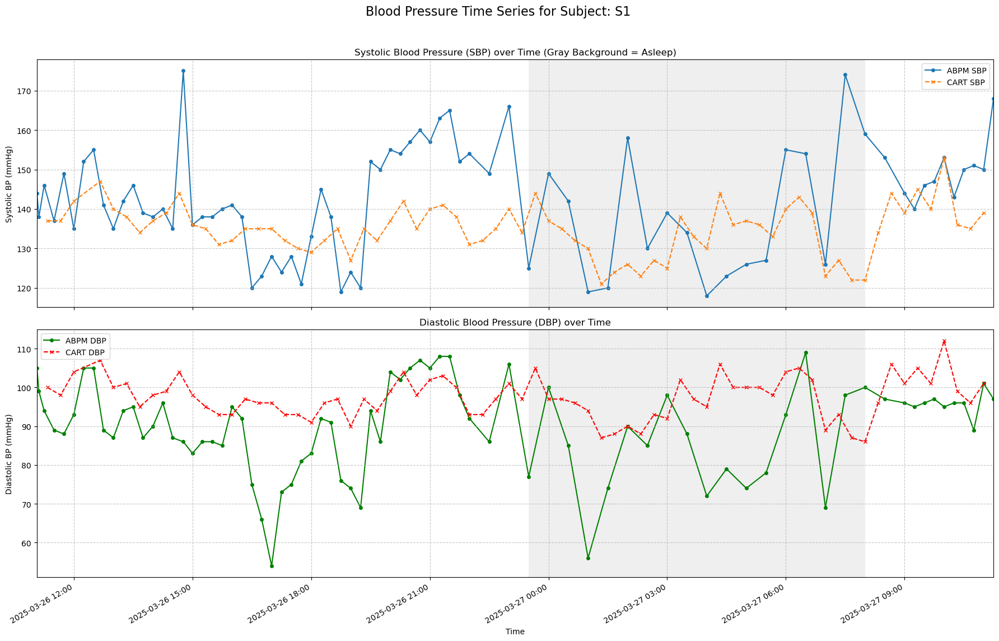

--- Processing Subject: S10 ---
[INFO] Generating time series plot for Subject: S10


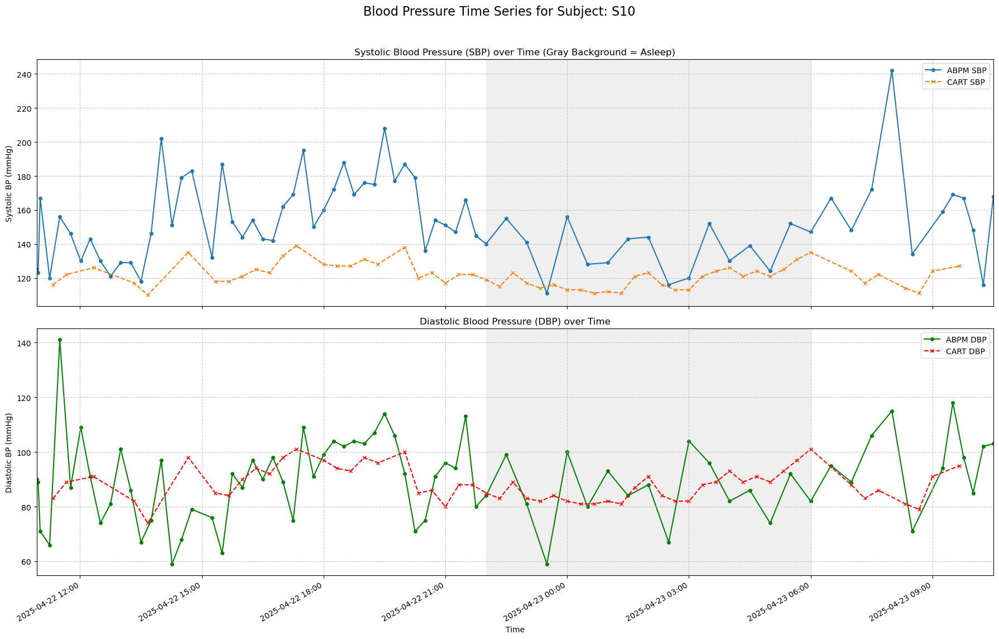

--- Processing Subject: S11 ---
[INFO] Generating time series plot for Subject: S11


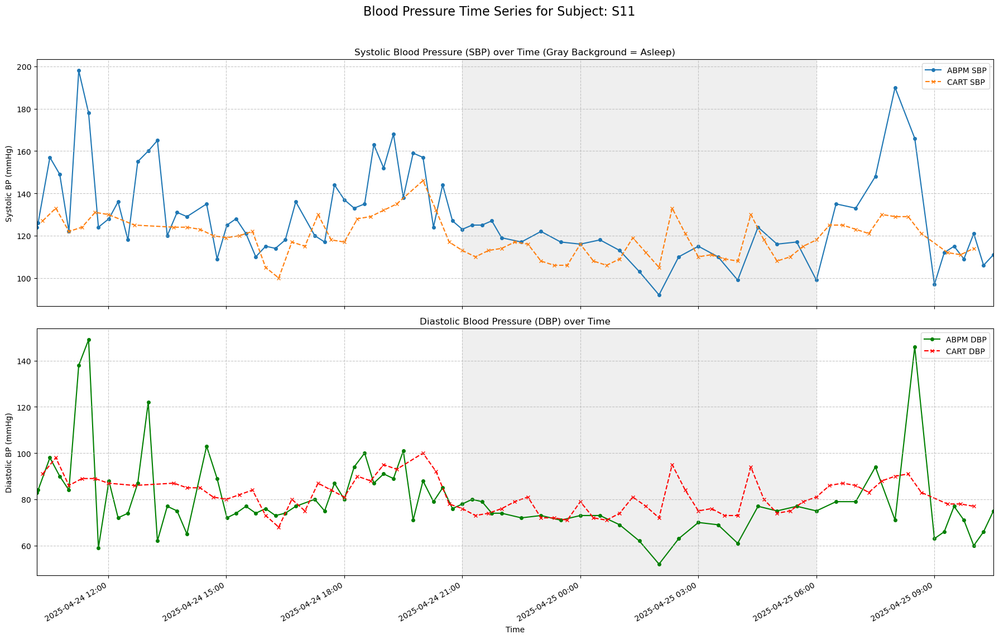

--- Processing Subject: S12 ---
[INFO] Generating time series plot for Subject: S12


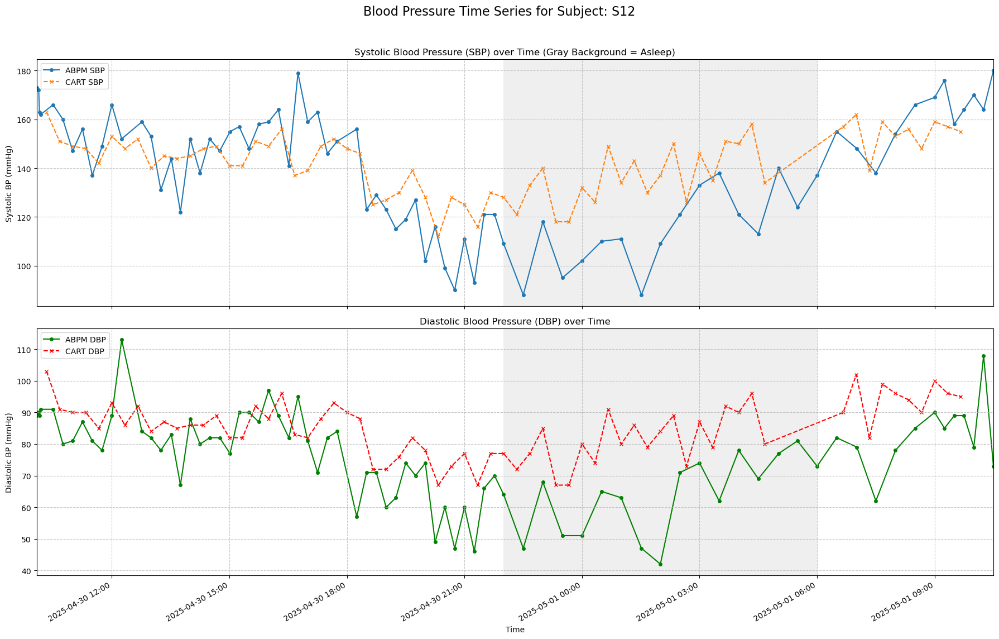

--- Processing Subject: S13 ---
[INFO] Generating time series plot for Subject: S13


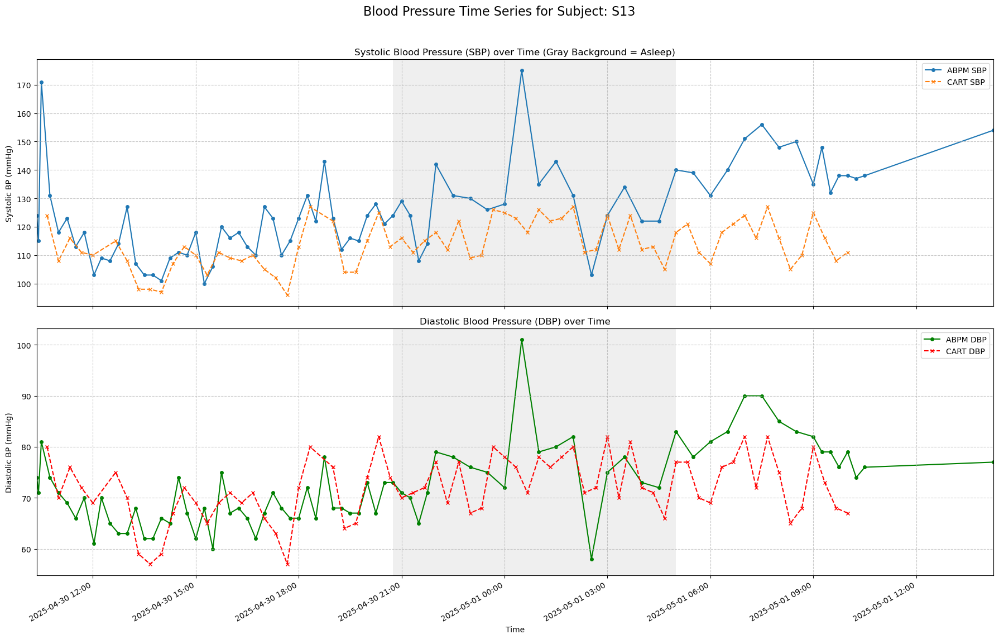

--- Processing Subject: S14 ---
[INFO] Generating time series plot for Subject: S14


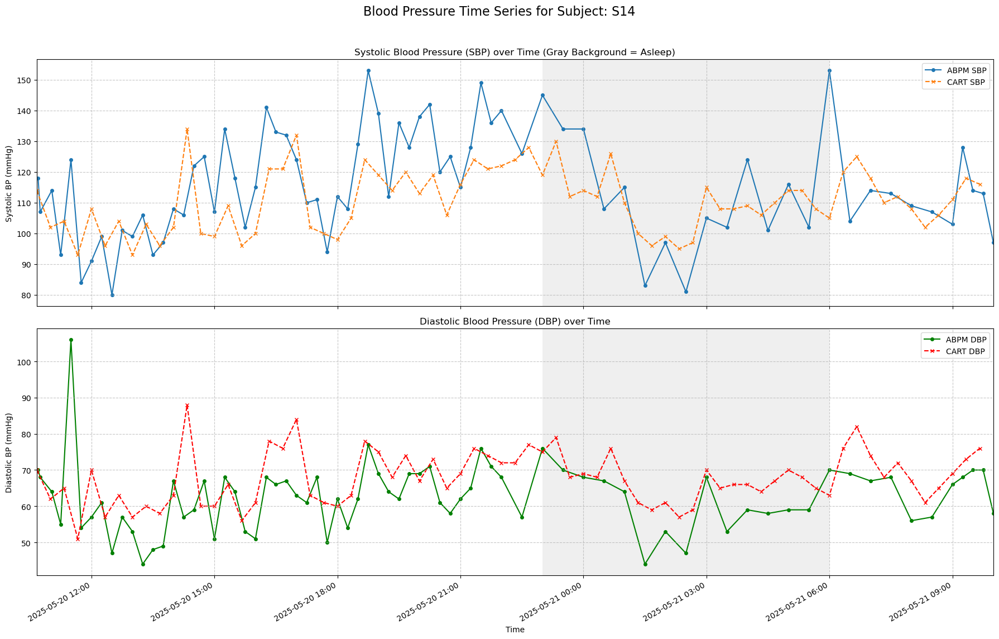

--- Processing Subject: S15 ---
[INFO] Generating time series plot for Subject: S15


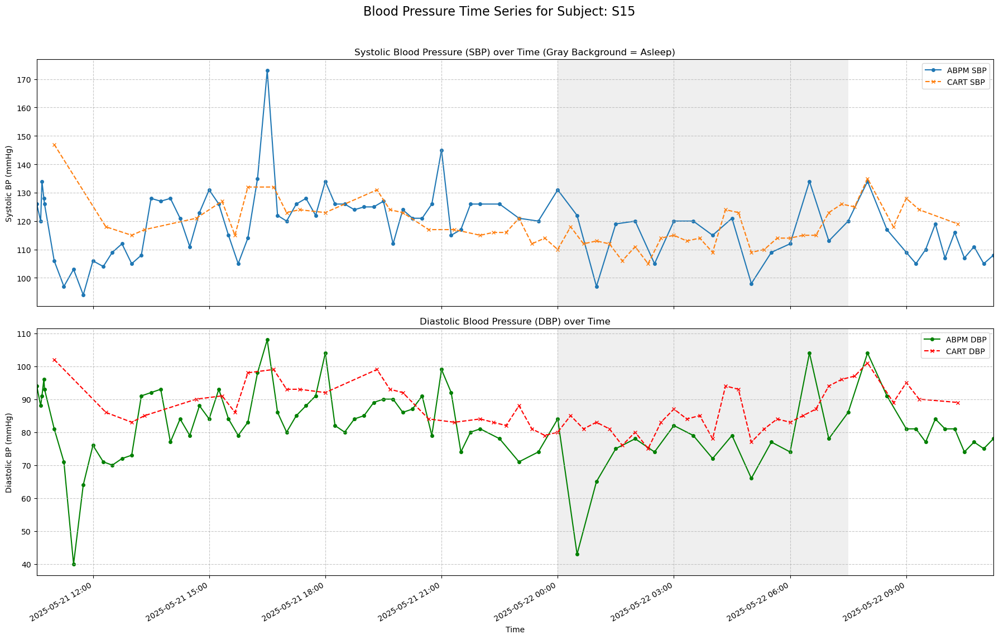

--- Processing Subject: S16 ---
[INFO] Generating time series plot for Subject: S16


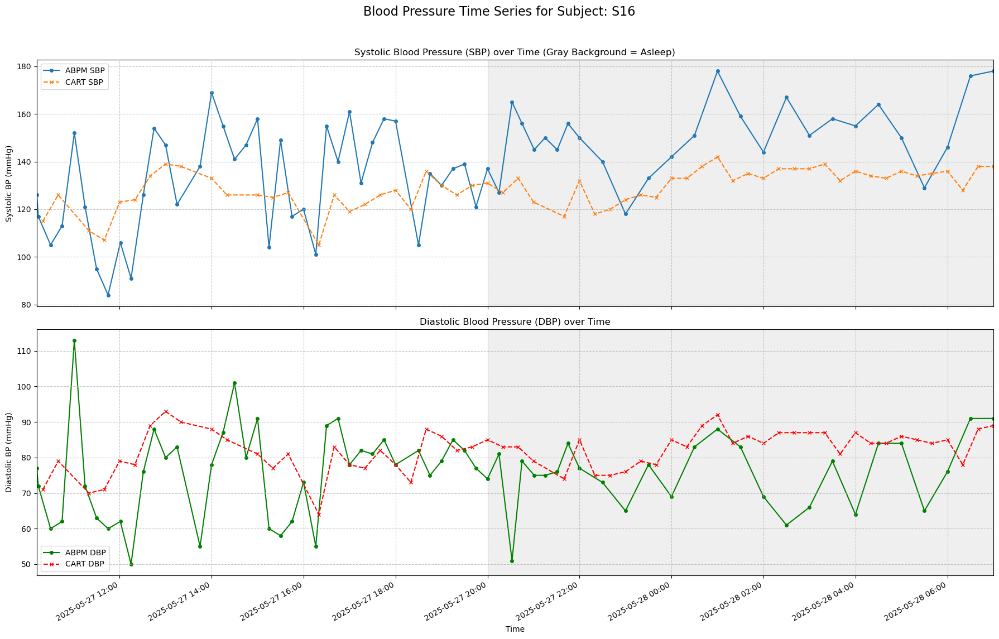

--- Processing Subject: S17 ---
[INFO] Generating time series plot for Subject: S17


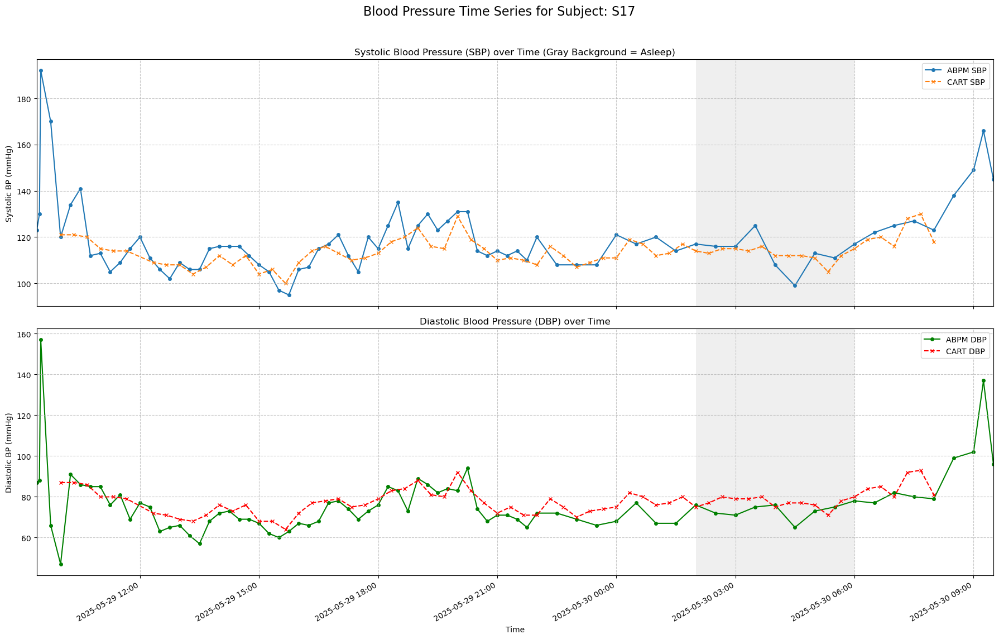

--- Processing Subject: S18 ---
[INFO] Generating time series plot for Subject: S18


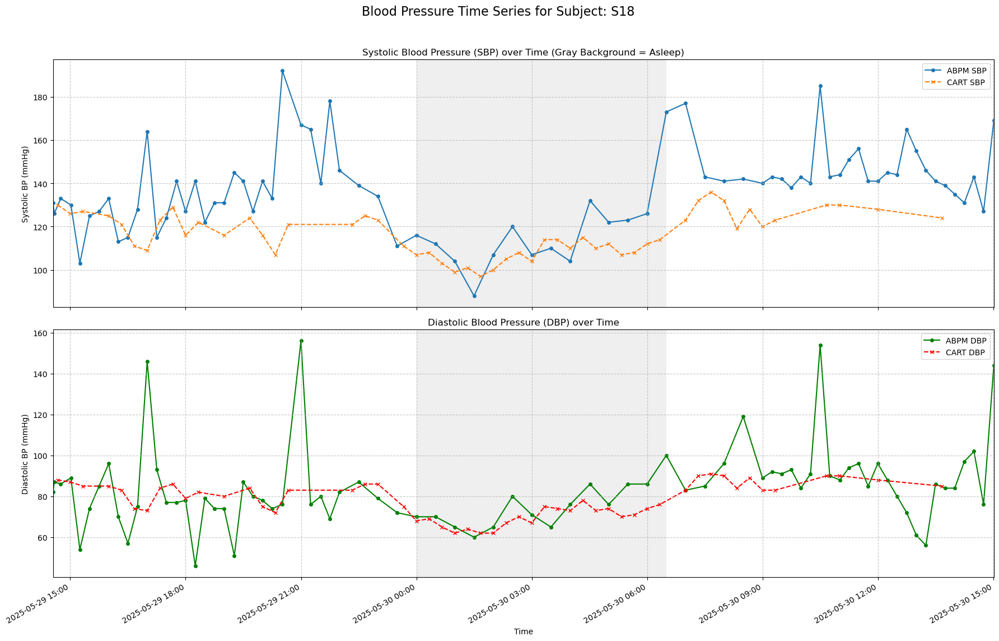

--- Processing Subject: S19 ---
[INFO] Generating time series plot for Subject: S19


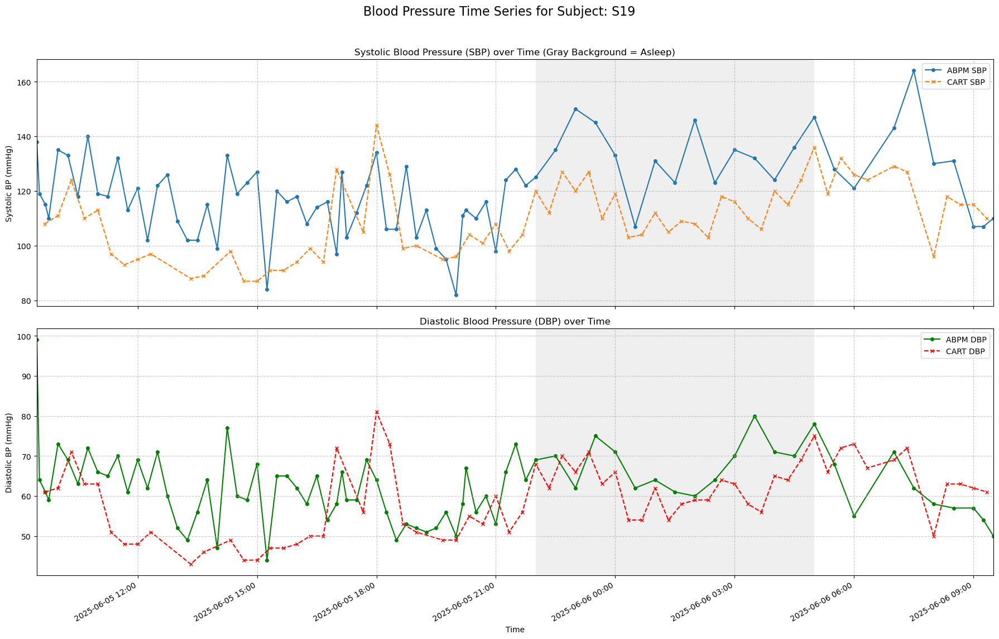

[INFO] S19: No matched pairs with identical sleep states found.
--- Processing Subject: S2 ---
[INFO] Generating time series plot for Subject: S2


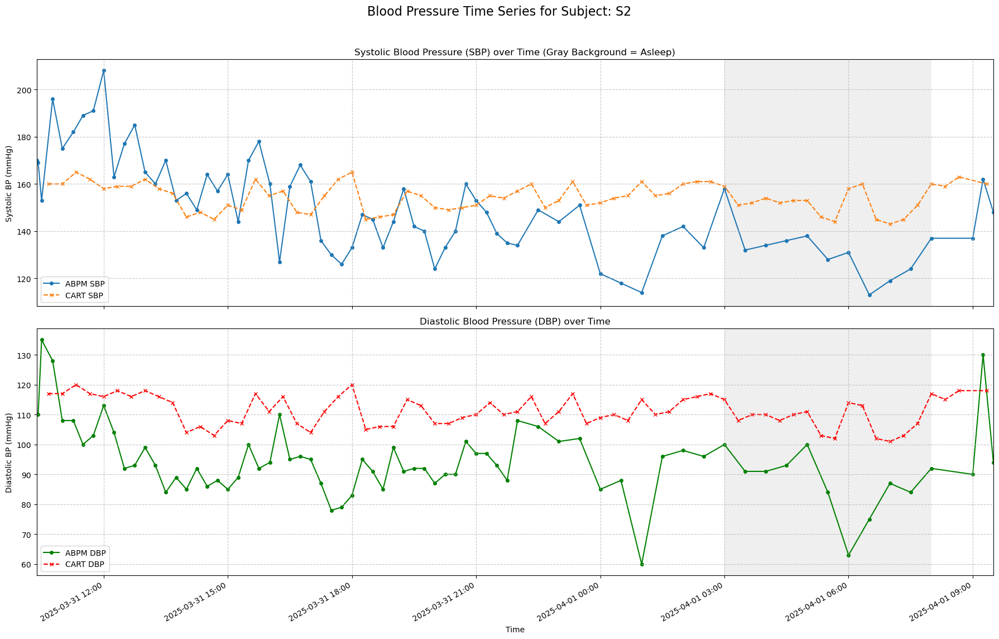

[INFO] S2: No matched pairs with identical sleep states found.
--- Processing Subject: S20 ---
[INFO] Generating time series plot for Subject: S20


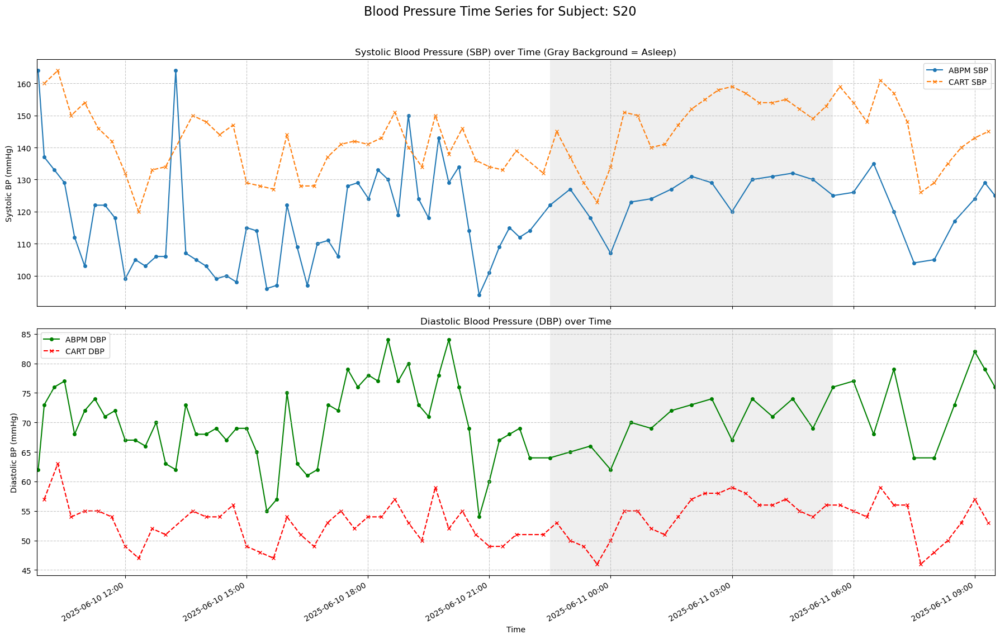

--- Processing Subject: S21 ---
[INFO] Generating time series plot for Subject: S21


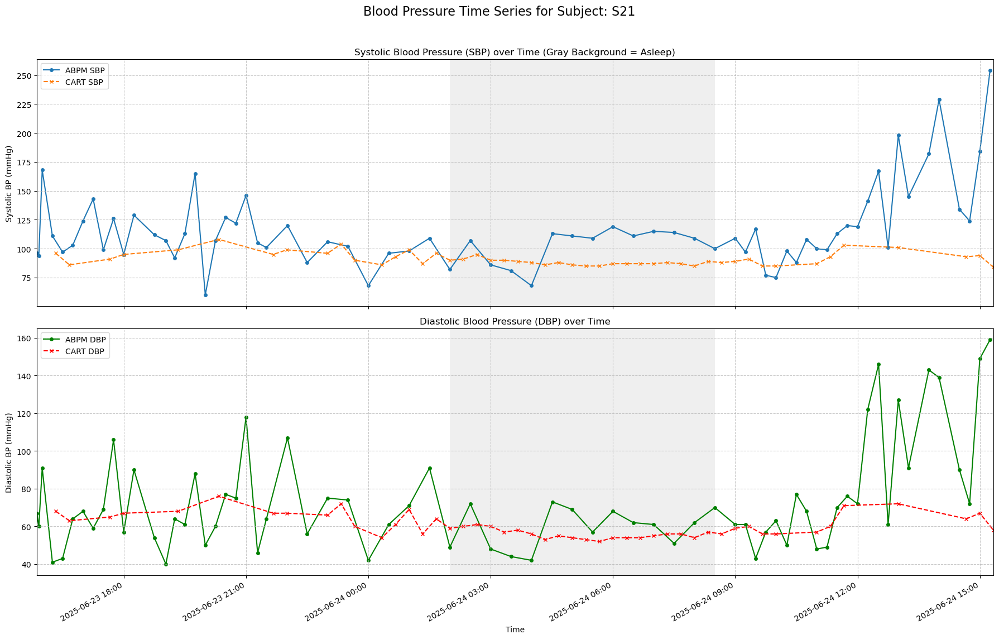

--- Processing Subject: S22 ---
[INFO] Generating time series plot for Subject: S22


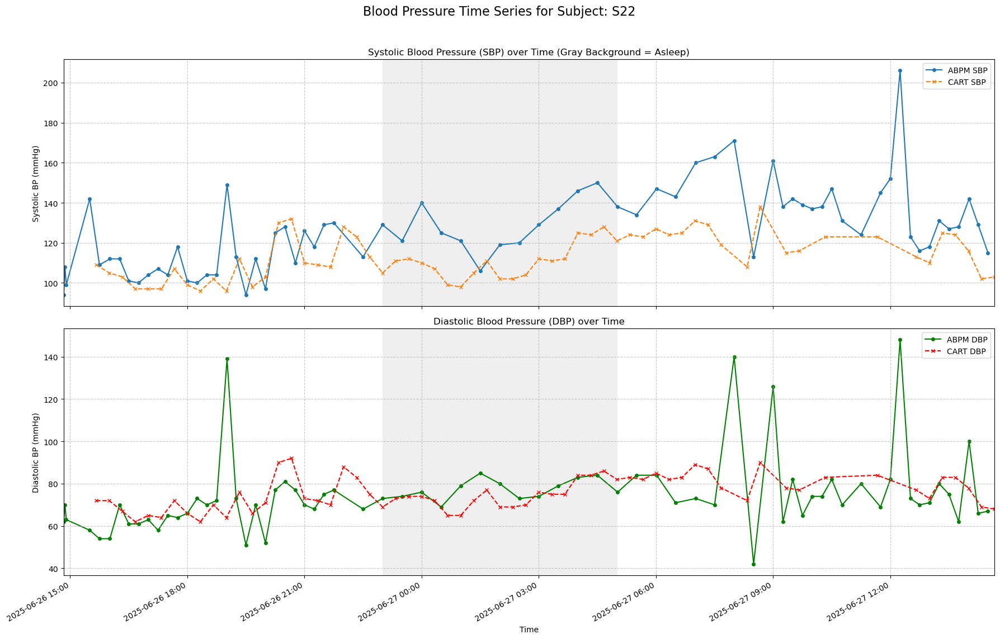

--- Processing Subject: S23 ---
[INFO] Generating time series plot for Subject: S23


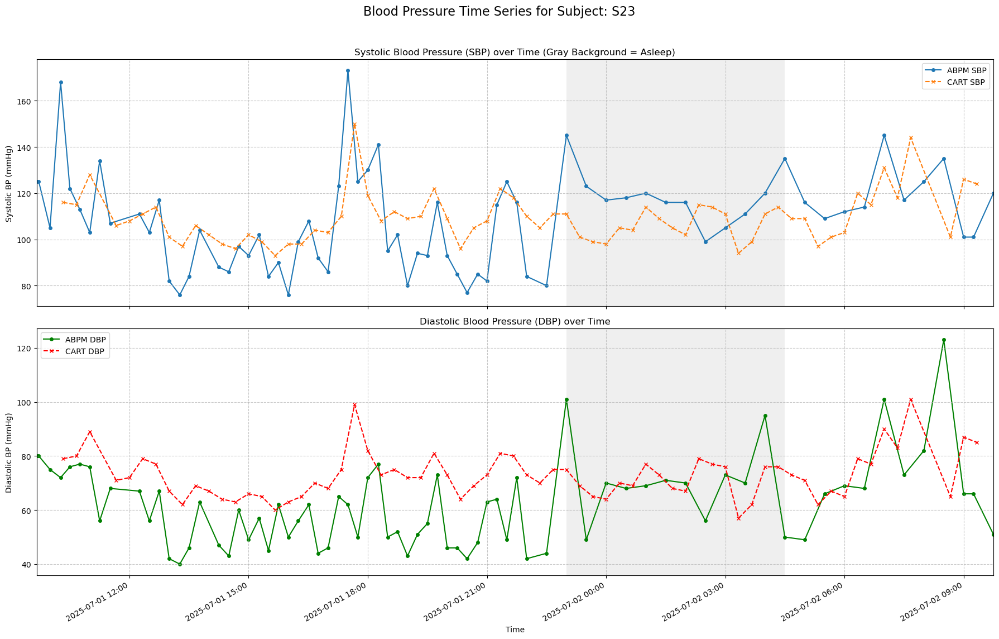

--- Processing Subject: S24 ---
[INFO] Generating time series plot for Subject: S24


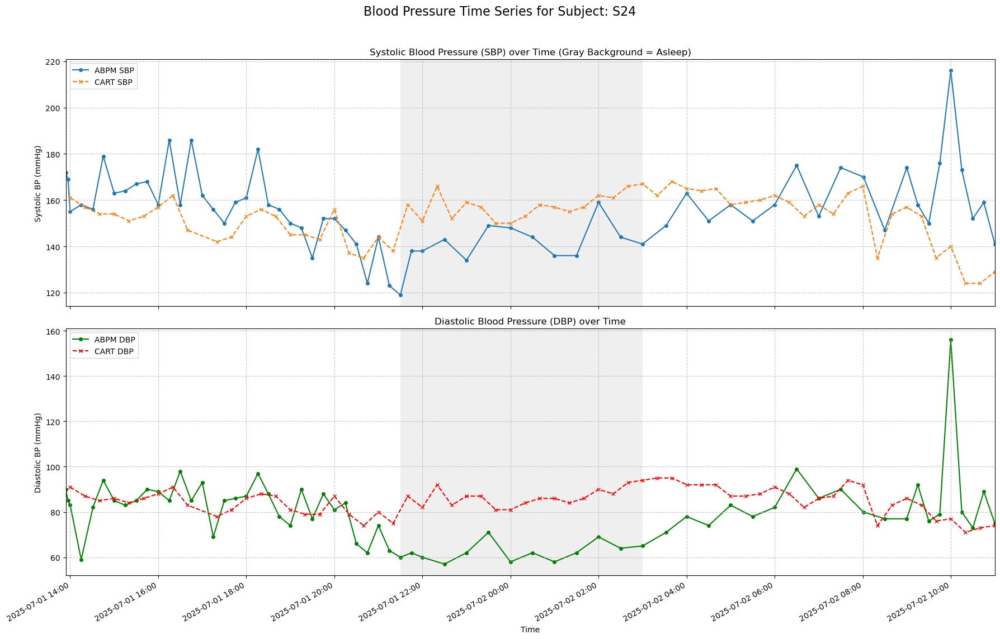

--- Processing Subject: S25 ---
[INFO] Generating time series plot for Subject: S25


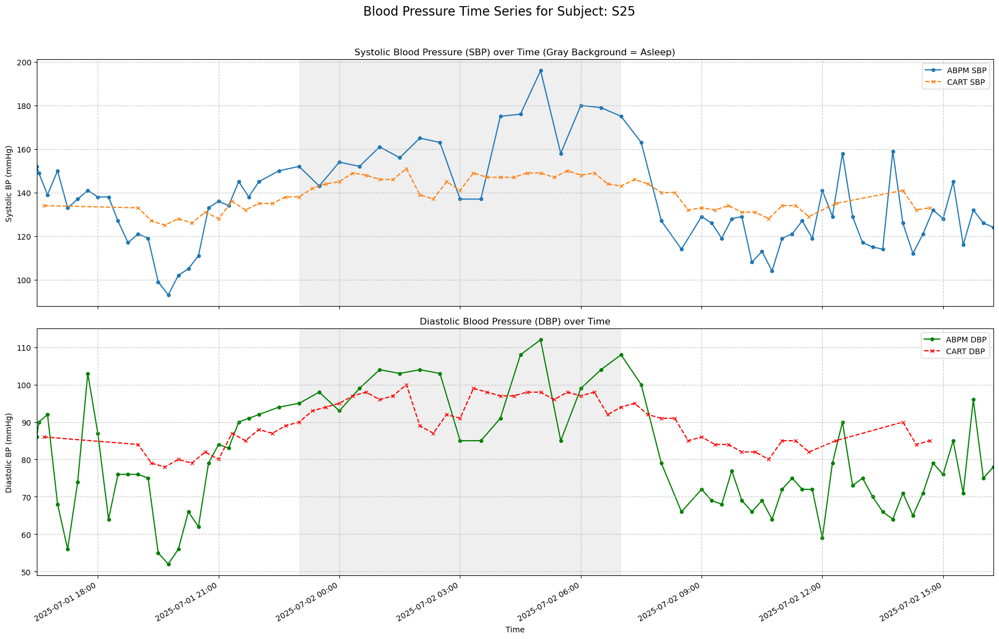

--- Processing Subject: S26 ---
[INFO] Generating time series plot for Subject: S26


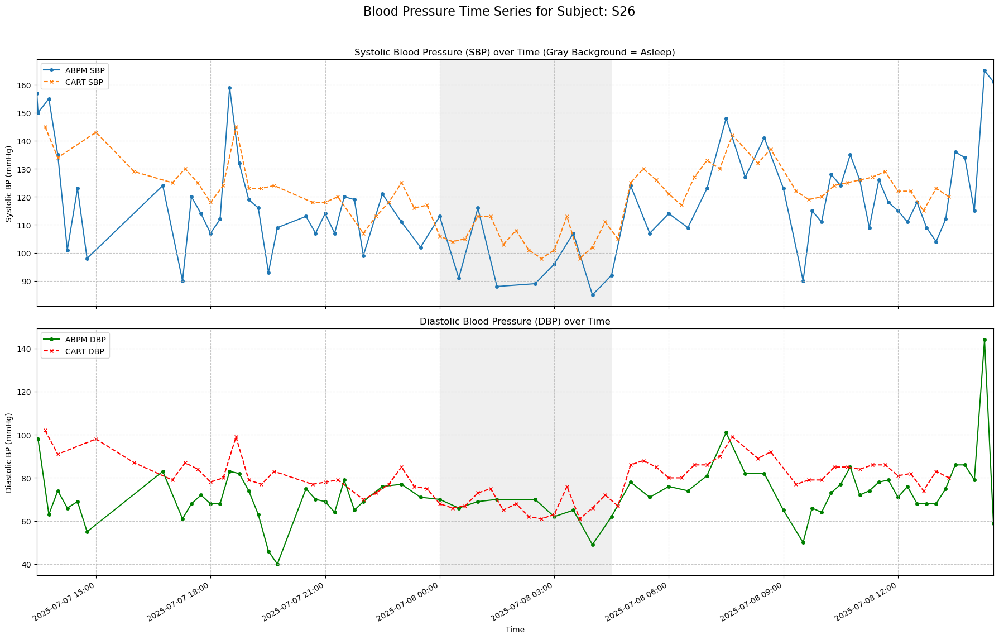

--- Processing Subject: S27 ---
[INFO] Generating time series plot for Subject: S27


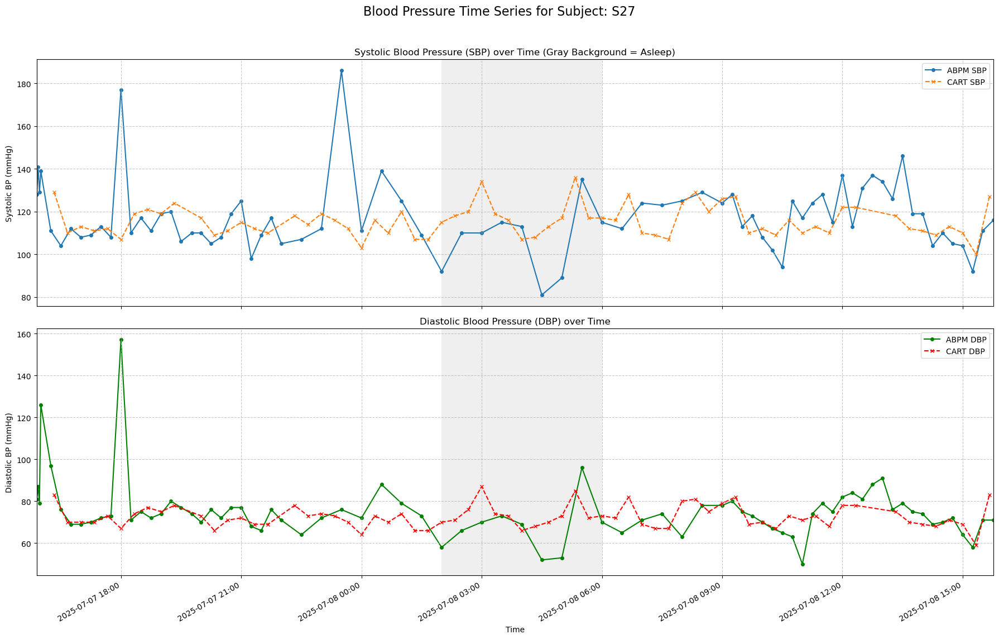

--- Processing Subject: S28 ---
[INFO] Generating time series plot for Subject: S28


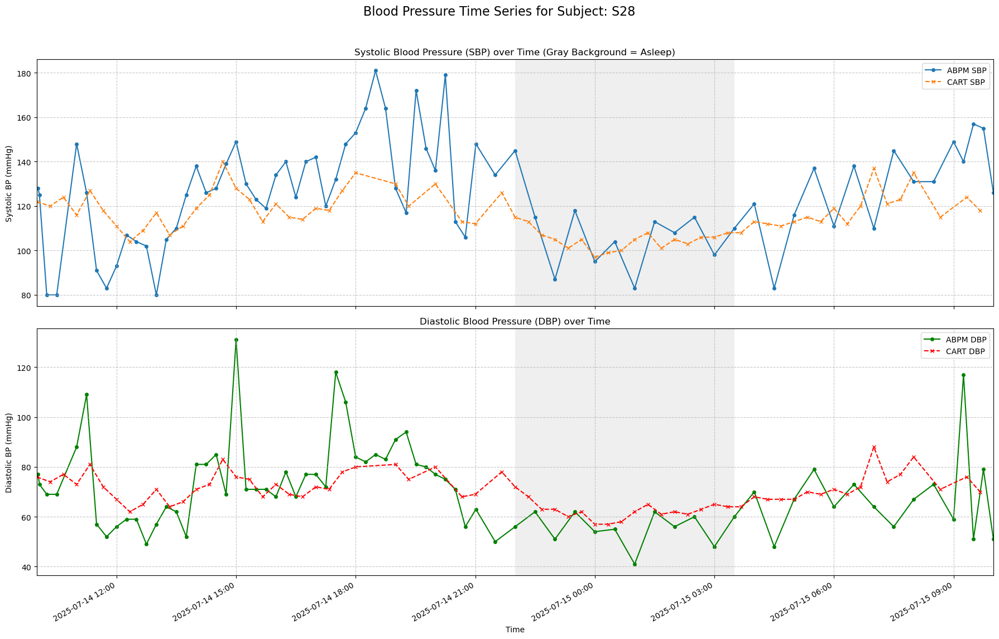

--- Processing Subject: S29 ---
[INFO] Generating time series plot for Subject: S29


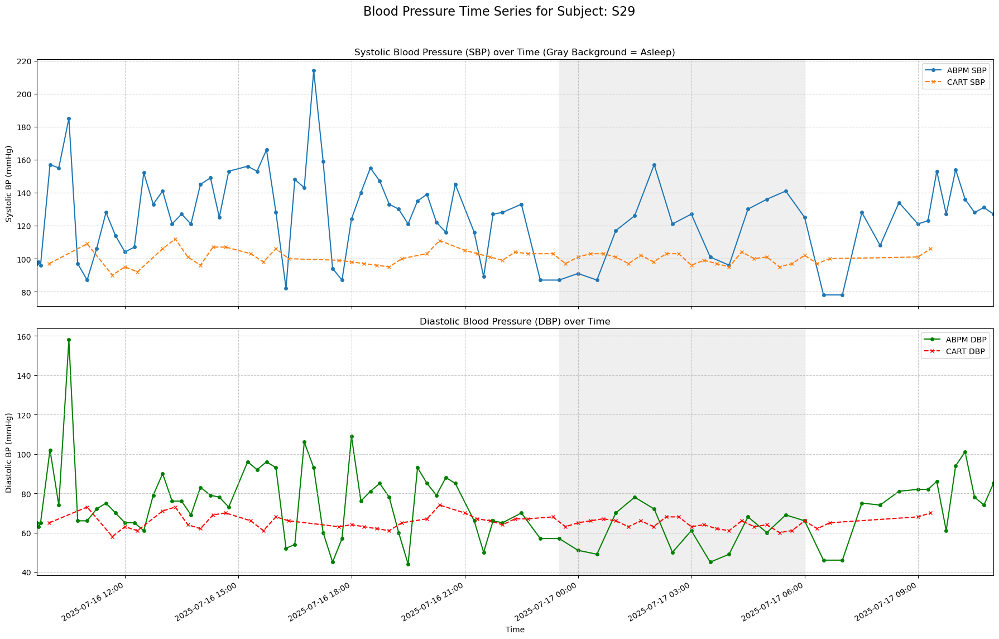

--- Processing Subject: S3 ---
[INFO] Generating time series plot for Subject: S3


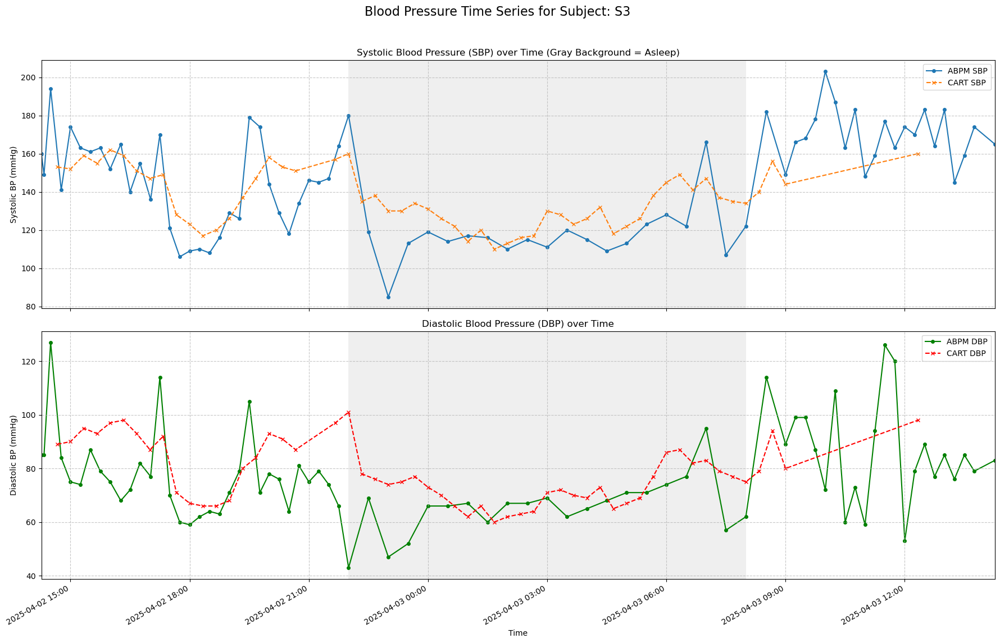

--- Processing Subject: S30 ---
[INFO] Generating time series plot for Subject: S30


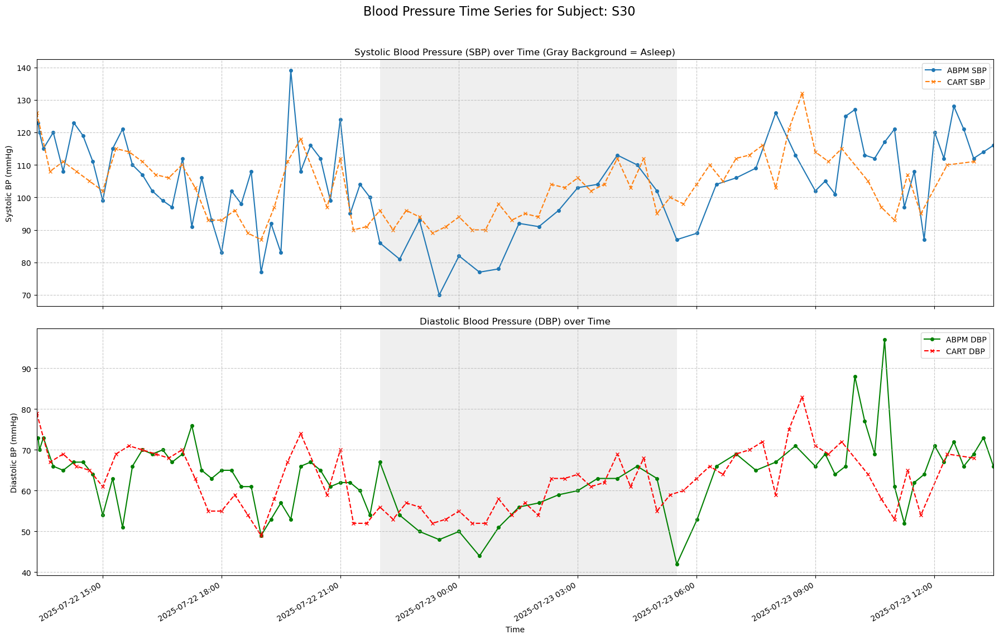

--- Processing Subject: S31 ---
[INFO] Generating time series plot for Subject: S31


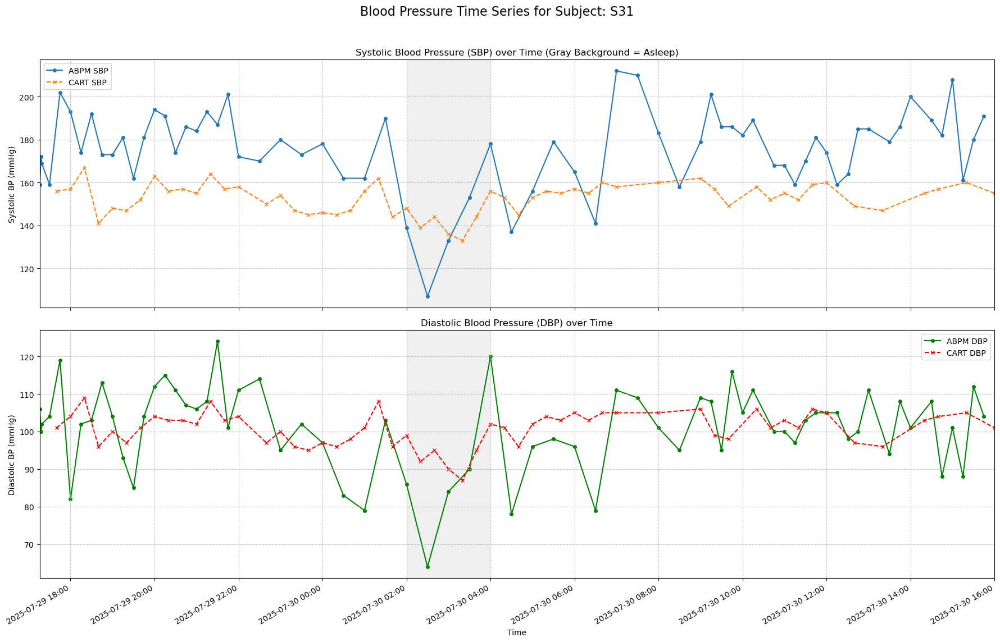

--- Processing Subject: S32 ---
[INFO] Generating time series plot for Subject: S32


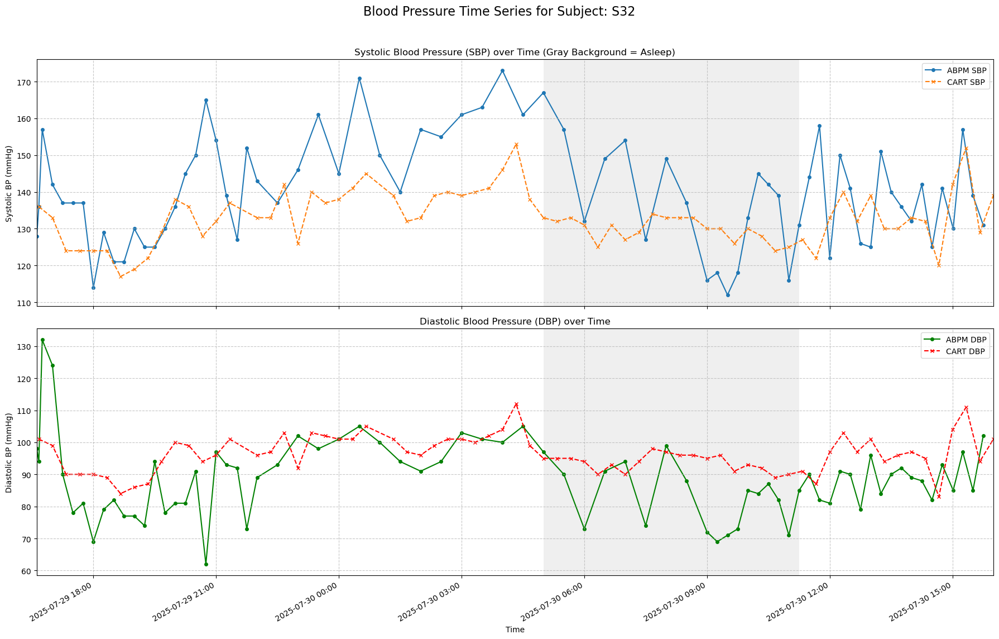

--- Processing Subject: S4 ---
[INFO] Generating time series plot for Subject: S4


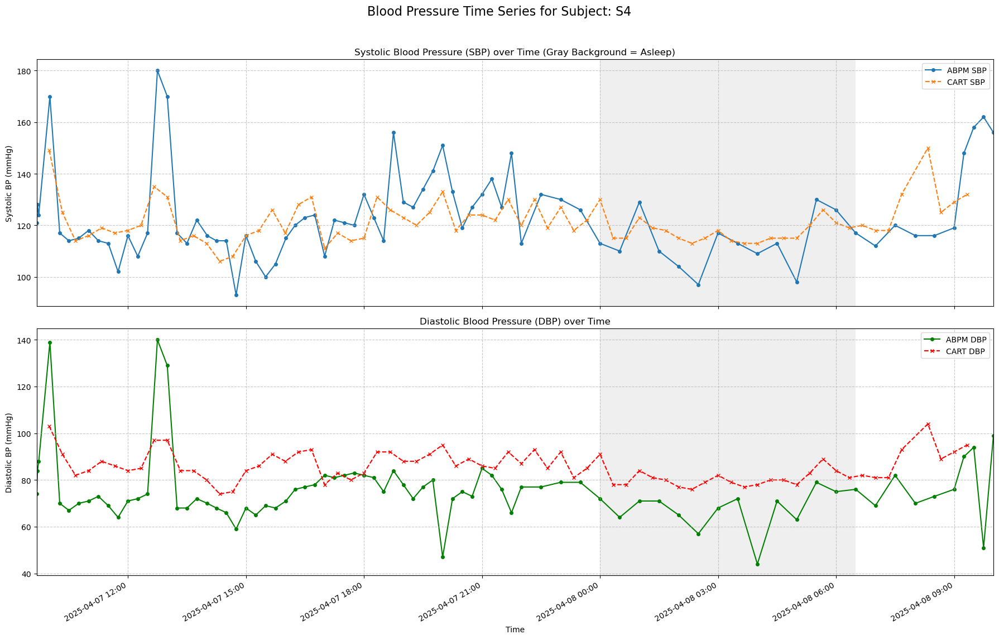

--- Processing Subject: S5 ---
[INFO] Generating time series plot for Subject: S5


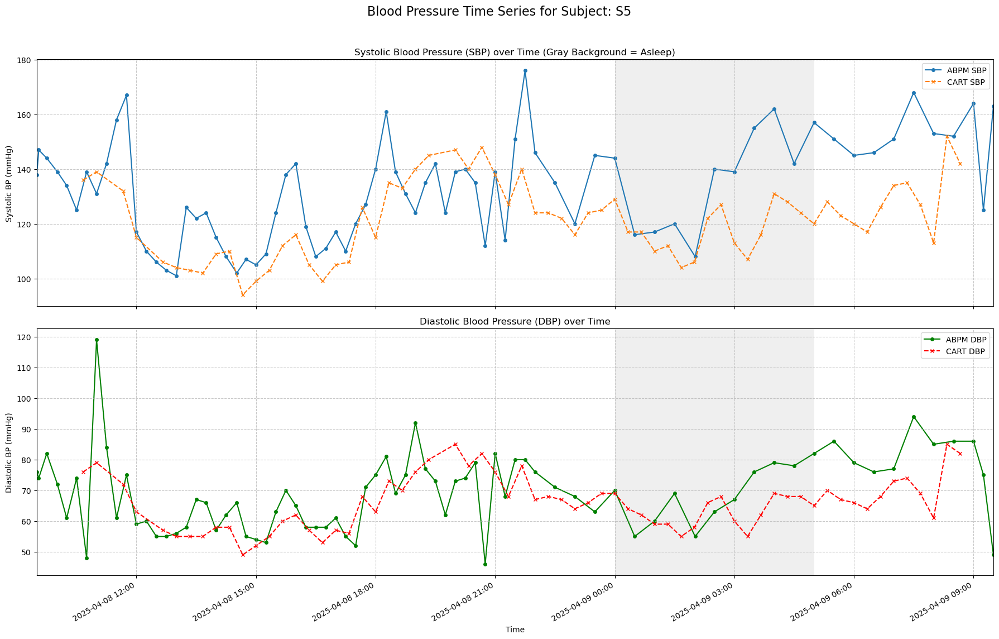

--- Processing Subject: S6 ---
[INFO] Generating time series plot for Subject: S6


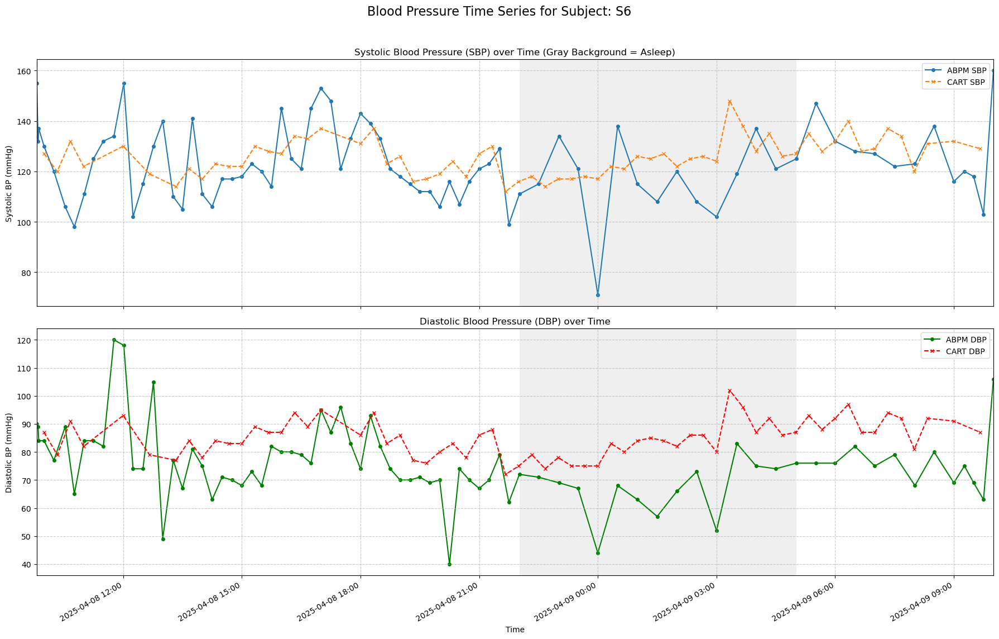

--- Processing Subject: S7 ---
[INFO] Generating time series plot for Subject: S7


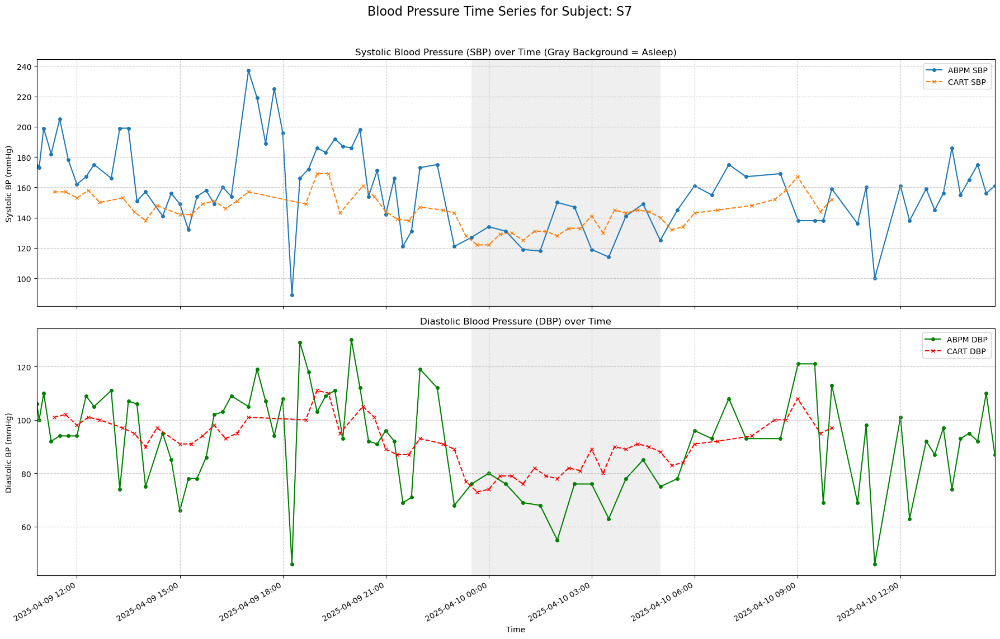

--- Processing Subject: S8 ---
[INFO] Generating time series plot for Subject: S8


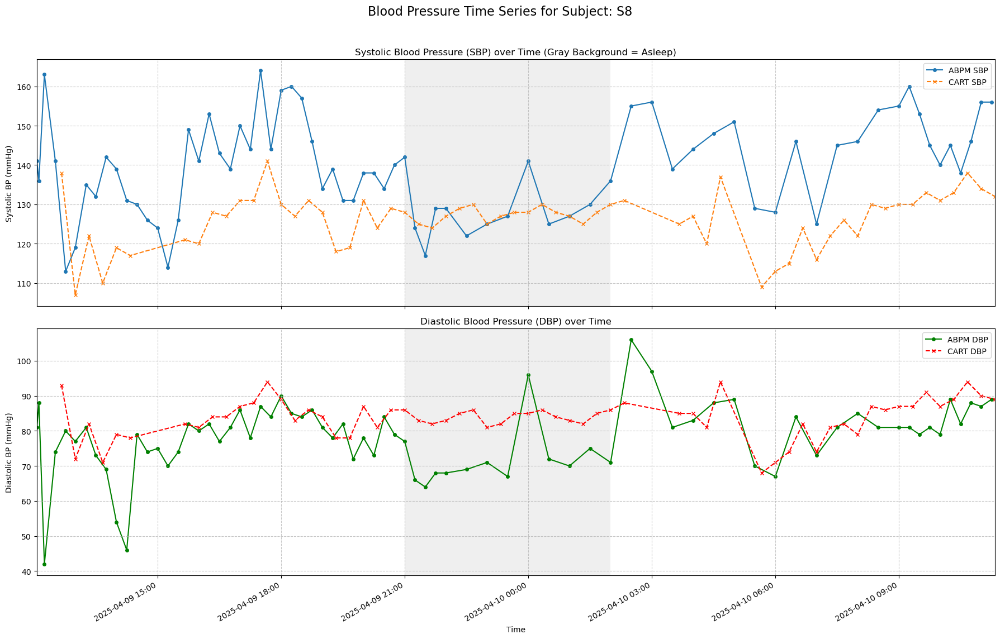

--- Processing Subject: S9 ---
[INFO] Generating time series plot for Subject: S9


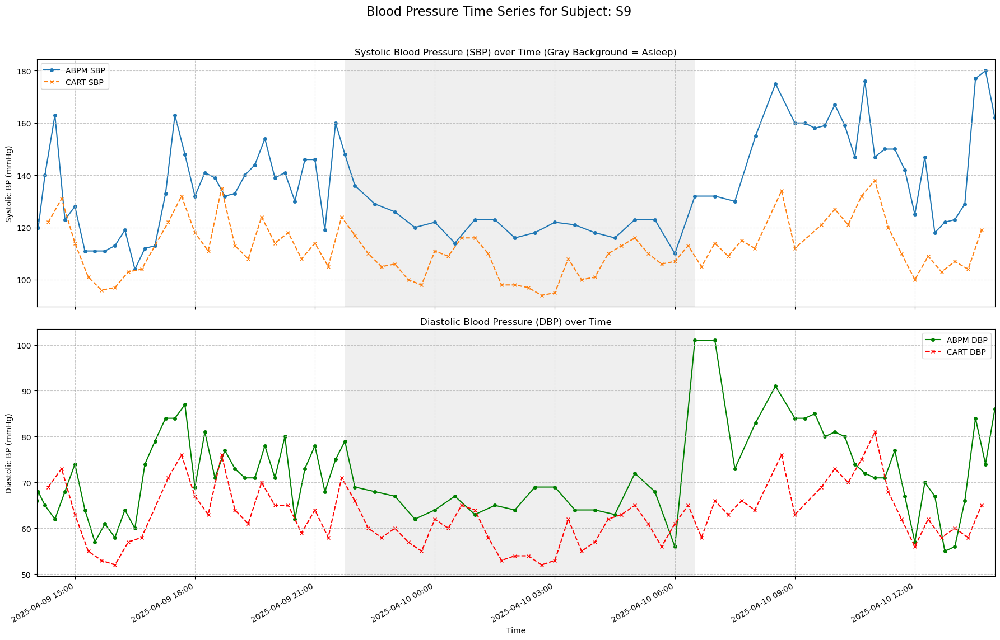


           Per-Subject Summary by Sleep State
   subject  sleep_state  n_pairs
0       S1            0       45
1       S1            1       15
2       S1            2       11
3      S10            0       35
4      S10            1       16
5      S10            2        5
6      S11            0       38
7      S11            1       20
8      S11            2        9
9      S12            0       45
10     S12            1       14
11     S12            2        9
12     S13            0       39
13     S13            1       10
14     S13            2       12
15     S14            0       48
16     S14            1       14
17     S14            2        9
18     S15            0       30
19     S15            1       15
20     S15            2        7
21     S16            0       34
22     S16            1       18
23     S17            0       55
24     S17            1        8
25     S17            2        3
26     S18            0       25
27     S18            1      

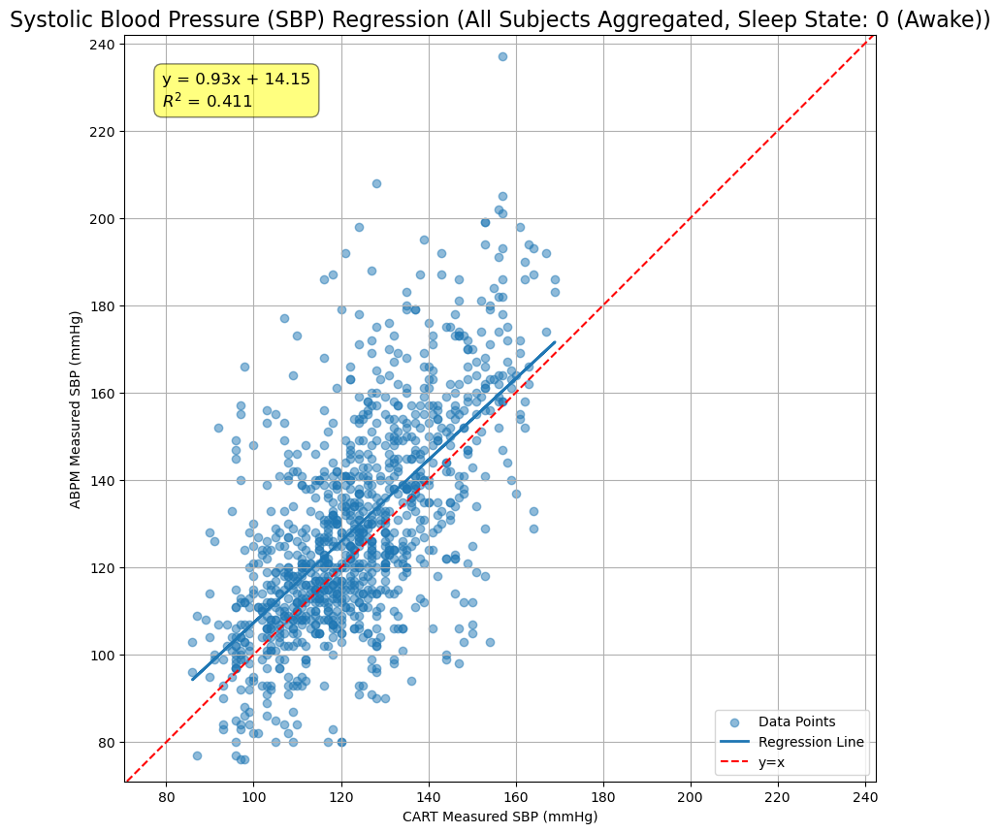

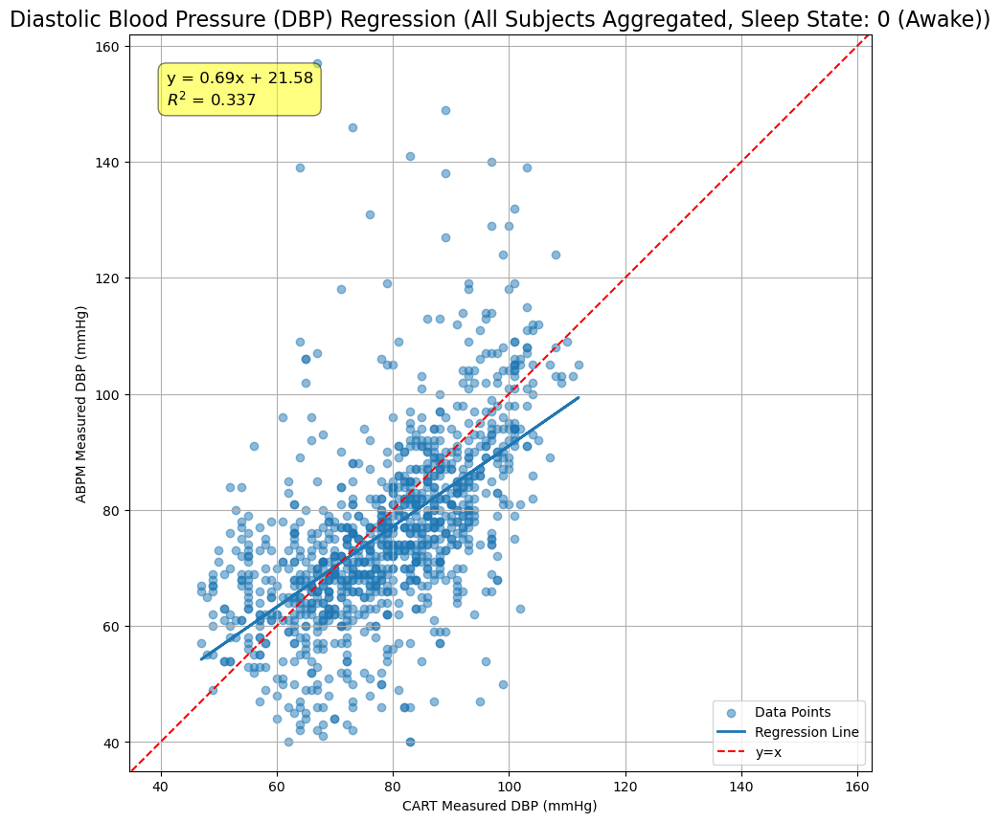


--- Sleep State: 1 ---
Total Matched Pairs: 395


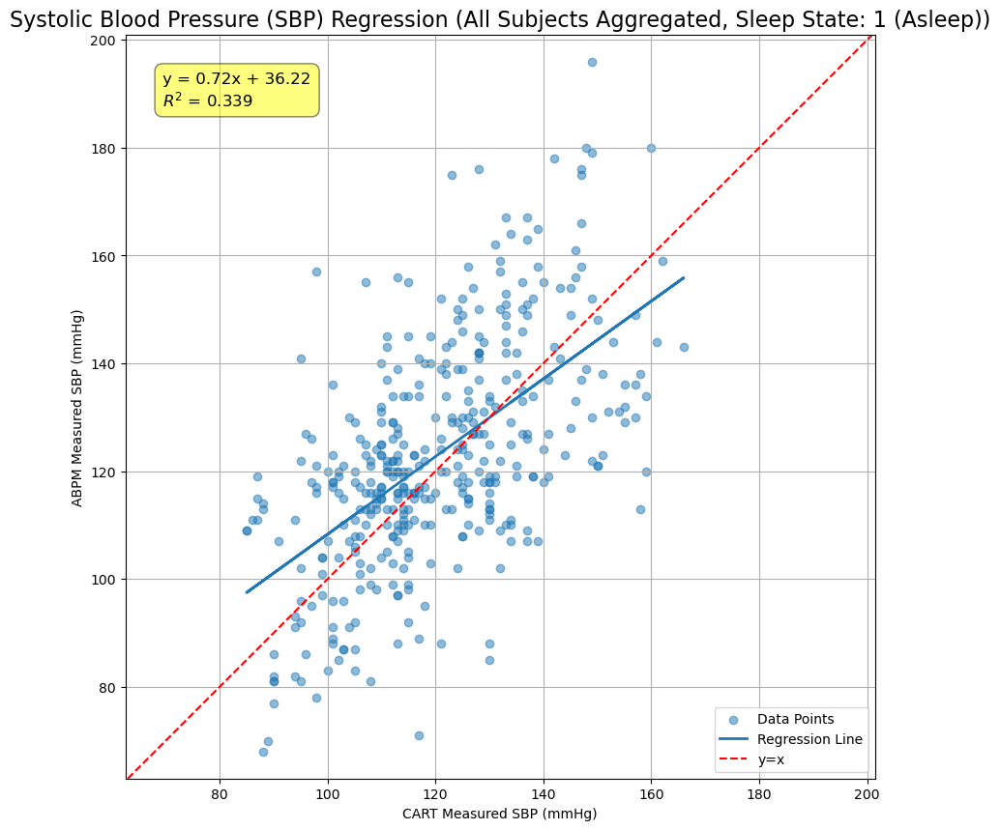

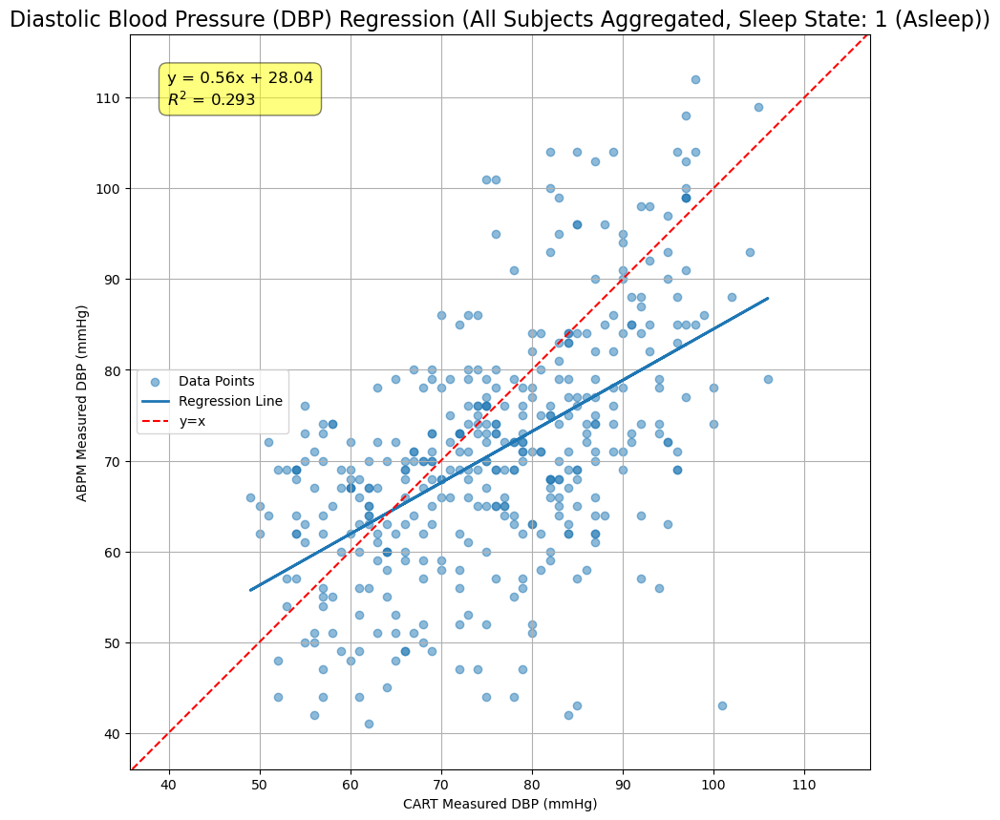


--- Sleep State: 2 ---
Total Matched Pairs: 390


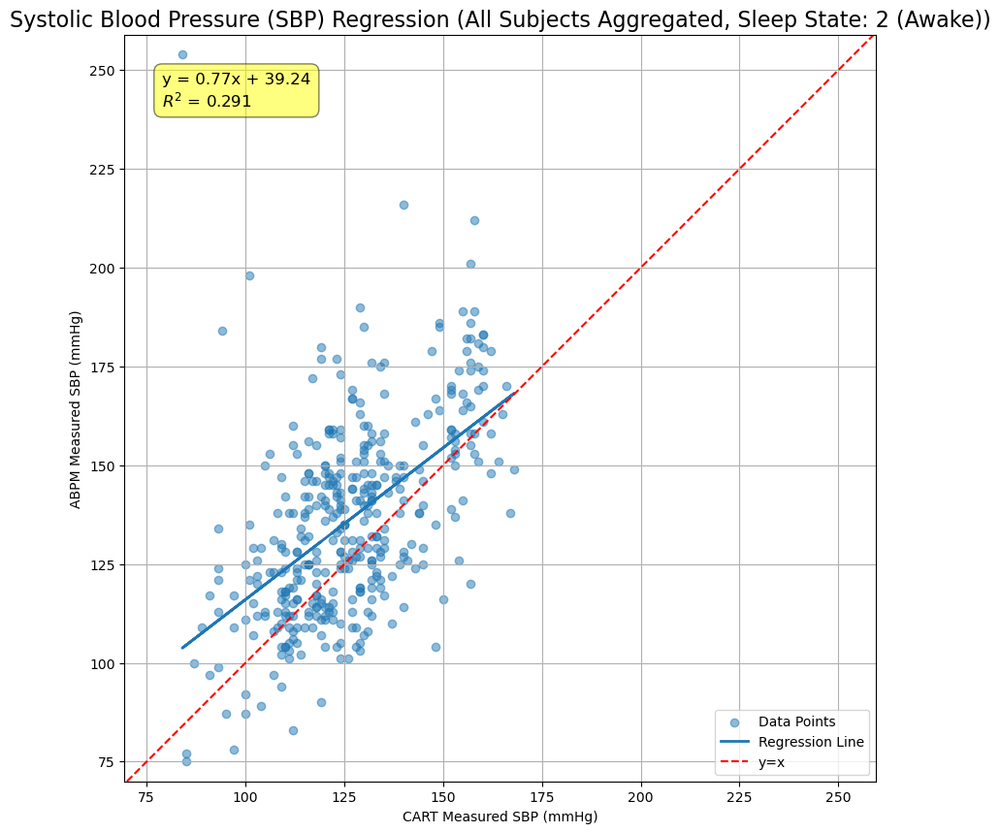

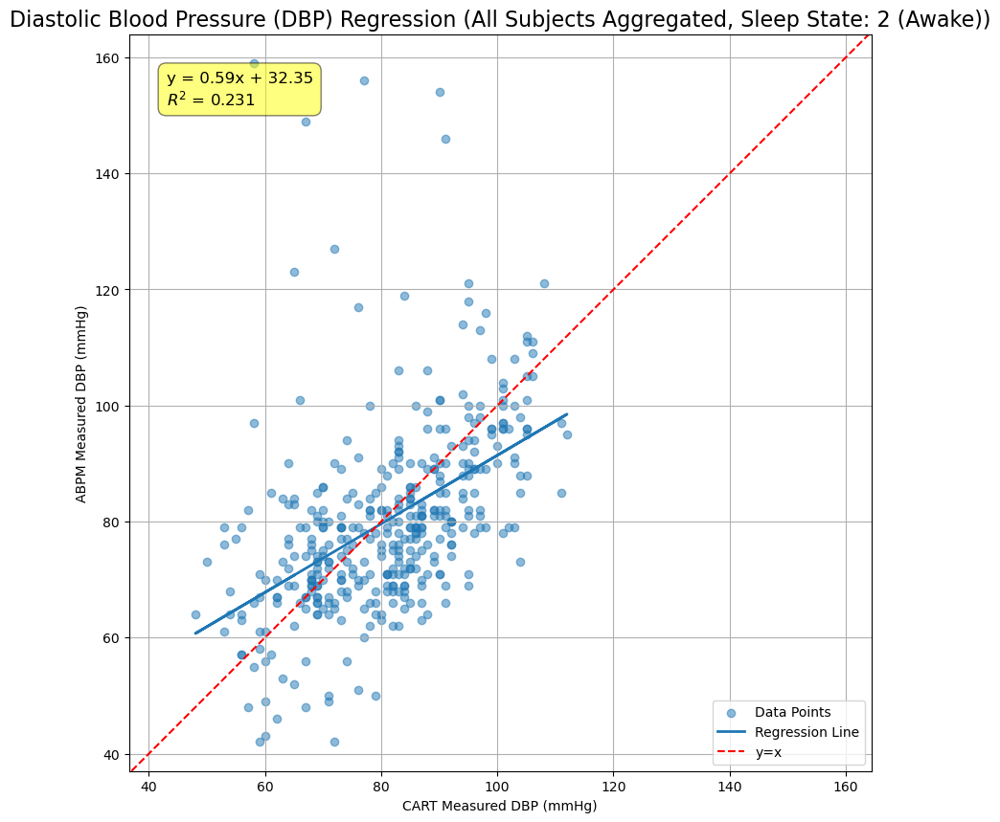

In [8]:
# -*- coding: utf-8 -*-"""GURO Hypertension: ABPM(SYS/DIA) vs CART_BP(SBP/DBP) correlation- Description:  (1) For each subject folder (S1-S32), plot time-series graphs of raw ABPM and CART with sleep-stage background.  (2) Match BP by nearest timestamp (±10 min).  (3) Compute summary per subject × sleep state (numeric summary only).  (4) Draw regression plots BY SLEEP STATE **ONLY FOR THE AGGREGATED (ALL SUBJECTS) DATA**.- Author: Gemini- Last updated: 2025-08-25"""
from pathlib import Path
import re
import numpy as np
import pandas as pd
# from scipy.stats import pearsonr  <- 상관관계 계산 라이브러리 제거
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.linear_model import LinearRegression

# ===================== User Settings =====================
BASE_DIR = r"E:\dataset\Hypertension\GURO\Data"
TIME_TOLERANCE = pd.Timedelta("10min")
MAX_HEADER_SCAN = 50
# =========================================================

def _read_any(path: Path, **kwargs) -> pd.DataFrame:
    if path.suffix.lower() in [".xlsx", ".xls"]:
        return pd.read_excel(path, **kwargs)
    for enc in ("utf-8-sig", "cp949", "euc-kr", "utf-8"):
        try:
            return pd.read_csv(path, encoding=enc, **kwargs)
        except Exception:
            pass
    return pd.read_csv(path, **kwargs)

def _norm_cols(df: pd.DataFrame) -> pd.DataFrame:
    def _clean(s):
        s = str(s).replace("\u200b", "")
        s = re.sub(r"\s+", " ", s).strip()
        return s
    return df.rename(columns=_clean)

def _pick_column(df: pd.DataFrame, candidates: list[str]) -> str | None:
    norm_cols = {re.sub(r"[\s\(\)]", "", c).lower(): c for c in df.columns}
    for cand in candidates:
        key = re.sub(r"[\s\(\)]", "", cand).lower()
        if key in norm_cols:
            return norm_cols[key]
    for col_name in df.columns:
        cc = re.sub(r"[\s\(\)]", "", col_name).lower()
        if any(re.sub(r"[\s\(\)]", "", cand).lower() in cc for cand in candidates):
            return col_name
    return None

def _parse_dt(df: pd.DataFrame, date_candidates: list[str], time_candidates: list[str]) -> pd.Series:
    dcol = _pick_column(df, date_candidates)
    tcol = _pick_column(df, time_candidates)
    if dcol is None or tcol is None:
        raise ValueError(f"Date/Time columns not found. Available columns: {df.columns.tolist()}")
    combo = df[dcol].astype(str).str.strip() + " " + df[tcol].astype(str).str.strip()
    dt = pd.to_datetime(combo, errors='coerce')
    if dt.isnull().all():
        dt = pd.to_datetime(combo, errors="coerce", infer_datetime_format=True)
    return dt

def _sniff_header_row(path: Path) -> int:
    try:
        raw = _read_any(path, header=None, nrows=MAX_HEADER_SCAN)
    except Exception as e:
        print(f"[WARN] Failed to read file during header scan ({path.name}): {e}. Assuming header is at row 0.")
        return 0
    keys = ["DATE", "TIME", "날짜", "시간", "SYS", "DIA", "SBP", "DBP", "SLEEP", "수면"]
    header_row = None
    for i in range(min(MAX_HEADER_SCAN, len(raw))):
        row_vals = [str(v) for v in raw.iloc[i].dropna().tolist()]
        if not row_vals:
            continue
        joined = " ".join(row_vals)
        norm = re.sub(r"[\s\(\)]", "", joined).upper()
        score = sum(1 for k in keys if re.sub(r"[\s\(\)]", "", k).upper() in norm)
        if score >= 3:
            header_row = i
            break
    if header_row is None:
        raise ValueError(f"[{path.name}] Could not find the data header row. Please check for summary blocks or empty rows.")
    return header_row

def load_data(path: Path, sbp_keys: list[str], dbp_keys: list[str],
              date_keys: list[str], time_keys: list[str], sleep_keys: list[str]) -> pd.DataFrame:
    try:
        df = _read_any(path)
        df = _norm_cols(df)
        dt = _parse_dt(df, date_keys, time_keys)
        sbp_col = _pick_column(df, sbp_keys)
        dbp_col = _pick_column(df, dbp_keys)
        sleep_col = _pick_column(df, sleep_keys)
        if sbp_col is None or dbp_col is None or dt.isnull().all():
            raise ValueError("Initial parsing failed, attempting header detection.")
    except Exception:
        header_row = _sniff_header_row(path)
        df = _read_any(path, header=header_row)
        df = _norm_cols(df)
        dt = _parse_dt(df, date_keys, time_keys)
        sbp_col = _pick_column(df, sbp_keys)
        dbp_col = _pick_column(df, dbp_keys)
        sleep_col = _pick_column(df, sleep_keys)
    if sbp_col is None or dbp_col is None:
        raise ValueError(f"[{path.name}] SBP/DBP columns not found. Available columns: {df.columns.tolist()}")
    data = {
        "datetime": dt,
        "sbp": pd.to_numeric(df[sbp_col], errors="coerce"),
        "dbp": pd.to_numeric(df[dbp_col], errors="coerce"),
    }
    if sleep_col:
        data["sleep"] = pd.to_numeric(df[sleep_col], errors="coerce")
    out = pd.DataFrame(data).dropna(subset=["datetime", "sbp", "dbp"])
    return out.sort_values("datetime").reset_index(drop=True)

def find_pair_files(subdir: Path) -> tuple[Path | None, Path | None]:
    files = [*subdir.glob("*.xlsx"), *subdir.glob("*.xls"), *subdir.glob("*.csv")]
    abpm_path, cart_path = None, None
    for f in files:
        name = f.name.lower()
        if "abpm" in name:
            abpm_path = f
        if "cart" in name:
            cart_path = f
    return abpm_path, cart_path

def plot_timeseries_for_subject(subject_id: str, abpm_df: pd.DataFrame, cart_df: pd.DataFrame):
    print(f"[INFO] Generating time series plot for Subject: {subject_id}")
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(18, 12), sharex=True)
    fig.suptitle(f"Blood Pressure Time Series for Subject: {subject_id}", fontsize=16)

    # Sleep background from ABPM
    if 'sleep' in abpm_df.columns and not abpm_df['sleep'].dropna().empty:
        sleep_df = abpm_df[['datetime', 'sleep']].dropna().sort_values('datetime').reset_index(drop=True)
        color_map = {0: '#ffffff', 1: '#e0e0e0'}
        if not sleep_df.empty:
            start_time = sleep_df['datetime'].iloc[0]
            current_state = sleep_df['sleep'].iloc[0]
            for i in range(1, len(sleep_df)):
                if sleep_df['sleep'].iloc[i] != current_state:
                    end_time = sleep_df['datetime'].iloc[i]
                    color = color_map.get(current_state, '#ffffff')
                    if color != '#ffffff':
                        ax1.axvspan(start_time, end_time, facecolor=color, alpha=0.5, zorder=0)
                        ax2.axvspan(start_time, end_time, facecolor=color, alpha=0.5, zorder=0)
                    start_time = end_time
                    current_state = sleep_df['sleep'].iloc[i]
            color = color_map.get(current_state, '#ffffff')
            if color != '#ffffff':
                plot_end_time = max(abpm_df['datetime'].max(), cart_df['datetime'].max())
                ax1.axvspan(start_time, plot_end_time, facecolor=color, alpha=0.5, zorder=0)
                ax2.axvspan(start_time, plot_end_time, facecolor=color, alpha=0.5, zorder=0)
    else:
        print(f"[INFO] No ABPM sleep data for subject {subject_id}. Background will not be colored.")

    ax1.plot(abpm_df['datetime'], abpm_df['sbp'], marker='o', markersize=4, linestyle='-', label='ABPM SBP', zorder=1)
    ax1.plot(cart_df['datetime'], cart_df['sbp'], marker='x', markersize=5, linestyle='--', label='CART SBP', zorder=1)
    ax1.set_ylabel("Systolic BP (mmHg)")
    ax1.set_title("Systolic Blood Pressure (SBP) over Time (Gray Background = Asleep)")
    ax1.legend()
    ax1.grid(True, linestyle='--', alpha=0.7)

    ax2.plot(abpm_df['datetime'], abpm_df['dbp'], marker='o', markersize=4, linestyle='-', label='ABPM DBP', color='green', zorder=1)
    ax2.plot(cart_df['datetime'], cart_df['dbp'], marker='x', markersize=5, linestyle='--', label='CART DBP', color='red', zorder=1)
    ax2.set_ylabel("Diastolic BP (mmHg)")
    ax2.set_title("Diastolic Blood Pressure (DBP) over Time")
    ax2.legend()
    ax2.grid(True, linestyle='--', alpha=0.7)

    ax2.set_xlabel("Time")
    ax2.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    plt.setp(ax2.get_xticklabels(), rotation=30, ha="right")

    min_time = min(abpm_df['datetime'].min(), cart_df['datetime'].min())
    max_time = max(abpm_df['datetime'].max(), cart_df['datetime'].max())
    ax1.set_xlim(min_time, max_time)

    plt.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()

def nearest_match(abpm: pd.DataFrame, cart: pd.DataFrame, tol: pd.Timedelta) -> pd.DataFrame:
    merged = pd.merge_asof(
        abpm.add_suffix("_abpm"),
        cart.add_suffix("_cart"),
        left_on="datetime_abpm",
        right_on="datetime_cart",
        direction="nearest",
        tolerance=tol
    )
    merged["abs_dt_diff"] = (merged["datetime_abpm"] - merged["datetime_cart"]).abs()
    return merged.dropna(subset=["sbp_cart", "dbp_cart"]).reset_index(drop=True)


def plot_correlation_regression(df: pd.DataFrame, plot_title_suffix: str):
    if df.empty:
        print(f"[INFO] No data available for '{plot_title_suffix}' to generate plots.")
        return

    # SBP
    plt.figure(figsize=(10, 10))
    sbp_data = df[['sbp_cart', 'sbp_abpm']].dropna()
    X_sbp = sbp_data[['sbp_cart']]
    y_sbp = sbp_data['sbp_abpm']
    if len(sbp_data) >= 2:
        model_sbp = LinearRegression().fit(X_sbp, y_sbp)
        y_pred_sbp = model_sbp.predict(X_sbp)
        plt.scatter(X_sbp, y_sbp, alpha=0.5, label="Data Points")
        plt.plot(X_sbp, y_pred_sbp, linewidth=2, label="Regression Line")
        min_val_sbp = min(X_sbp.min().iloc[0], y_sbp.min()) - 5
        max_val_sbp = max(X_sbp.max().iloc[0], y_sbp.max()) + 5
        plt.plot([min_val_sbp, max_val_sbp], [min_val_sbp, max_val_sbp], 'r--', label="y=x")
        coef_sbp = model_sbp.coef_[0]; intercept_sbp = model_sbp.intercept_; r2_sbp = model_sbp.score(X_sbp, y_sbp)
        eq_text_sbp = f'y = {coef_sbp:.2f}x + {intercept_sbp:.2f}\n$R^2$ = {r2_sbp:.3f}'
        plt.text(0.05, 0.95, eq_text_sbp, transform=plt.gca().transAxes, fontsize=12,
                 va='top', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
        plt.title(f"Systolic Blood Pressure (SBP) Regression ({plot_title_suffix})", fontsize=16)
        plt.xlabel("CART Measured SBP (mmHg)"); plt.ylabel("ABPM Measured SBP (mmHg)")
        plt.grid(True); plt.axis('equal'); plt.xlim(min_val_sbp, max_val_sbp); plt.ylim(min_val_sbp, max_val_sbp); plt.legend()
        plt.show()
    else:
        print(f"[INFO] Not enough SBP data for '{plot_title_suffix}' to plot.")

    # DBP
    plt.figure(figsize=(10, 10))
    dbp_data = df[['dbp_cart', 'dbp_abpm']].dropna()
    X_dbp = dbp_data[['dbp_cart']]
    y_dbp = dbp_data['dbp_abpm']
    if len(dbp_data) >= 2:
        model_dbp = LinearRegression().fit(X_dbp, y_dbp)
        y_pred_dbp = model_dbp.predict(X_dbp)
        plt.scatter(X_dbp, y_dbp, alpha=0.5, label="Data Points")
        plt.plot(X_dbp, y_pred_dbp, linewidth=2, label="Regression Line")
        min_val_dbp = min(X_dbp.min().iloc[0], y_dbp.min()) - 5
        max_val_dbp = max(X_dbp.max().iloc[0], y_dbp.max()) + 5
        plt.plot([min_val_dbp, max_val_dbp], [min_val_dbp, max_val_dbp], 'r--', label="y=x")
        coef_dbp = model_dbp.coef_[0]; intercept_dbp = model_dbp.intercept_; r2_dbp = model_dbp.score(X_dbp, y_dbp)
        eq_text_dbp = f'y = {coef_dbp:.2f}x + {intercept_dbp:.2f}\n$R^2$ = {r2_dbp:.3f}'
        plt.text(0.05, 0.95, eq_text_dbp, transform=plt.gca().transAxes, fontsize=12,
                 va='top', bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5))
        plt.title(f"Diastolic Blood Pressure (DBP) Regression ({plot_title_suffix})", fontsize=16)
        plt.xlabel("CART Measured DBP (mmHg)"); plt.ylabel("ABPM Measured DBP (mmHg)")
        plt.grid(True); plt.axis('equal'); plt.xlim(min_val_dbp, max_val_dbp); plt.ylim(min_val_dbp, max_val_dbp); plt.legend()
        plt.show()
    else:
        print(f"[INFO] Not enough DBP data for '{plot_title_suffix}' to plot.")

def process_subject(subdir: Path):
    """Per-subject pipeline: time-series plot; match; numeric summary by sleep (no per-subject regression plots)."""
    subject_id = subdir.name
    print(f"--- Processing Subject: {subject_id} ---")

    abpm_path, cart_path = find_pair_files(subdir)
    if not abpm_path or not cart_path:
        print(f"[WARN] {subject_id}: ABPM or CART file not found. Skipping.")
        return None, None

    try:
        abpm_df = load_data(abpm_path, sbp_keys=["SYS(O)", "SYS"], dbp_keys=["DIA(O)", "DIA"],
                            date_keys=["DATE", "날짜"], time_keys=["TIME", "시간"], sleep_keys=["SLEEP"])
        cart_df = load_data(cart_path, sbp_keys=["수축기 (SBP)"], dbp_keys=["이완기 (DBP)"],
                            date_keys=["날짜", "DATE"], time_keys=["시간", "TIME"], sleep_keys=["수면", "sleep"])
    except Exception as e:
        print(f"[ERROR] Failed to process files for {subject_id}: {e}")
        return None, None

    if abpm_df.empty or cart_df.empty:
        print(f"[WARN] {subject_id}: No valid data found after loading. (ABPM: {len(abpm_df)}, CART: {len(cart_df)})")
        return None, None

    # (1) per-subject time series plot
    plot_timeseries_for_subject(subject_id, abpm_df, cart_df)

    # (2) nearest match
    matched = nearest_match(abpm_df, cart_df, TIME_TOLERANCE)

    # (3) retain only rows with identical sleep states if both sources have sleep
    if "sleep_abpm" in matched.columns and "sleep_cart" in matched.columns:
        matched = matched.dropna(subset=["sleep_abpm", "sleep_cart"])
        matched = matched[matched["sleep_abpm"] == matched["sleep_cart"]].copy()
        matched.rename(columns={"sleep_abpm": "sleep"}, inplace=True)
    else:
        print(f"[WARN] {subject_id}: 'sleep' column not found in one or both files. Cannot perform sleep-based analysis.")
        return [], None

    if matched.empty:
        print(f"[INFO] {subject_id}: No matched pairs with identical sleep states found.")
        return [], None

    # (4) numeric summary only (NO plots here)
    summaries = []
    for sleep_state, group in matched.groupby('sleep'):
        # r_sbp, p_sbp = corr_safe(group["sbp_abpm"], group["sbp_cart"]) <- 상관관계 계산 제거
        # r_dbp, p_dbp = corr_safe(group["dbp_abpm"], group["dbp_cart"]) <- 상관관계 계산 제거
        summaries.append({
            "subject": subject_id,
            "sleep_state": int(sleep_state),
            "n_pairs": len(group),
            # "r_sbp": r_sbp, "p_sbp": p_sbp, <- 결과 저장 제거
            # "r_dbp": r_dbp, "p_dbp": p_dbp   <- 결과 저장 제거
        })

    return summaries, matched

def main():
    base = Path(BASE_DIR)
    if not base.is_dir():
        print(f"[ERROR] The specified directory does not exist: {BASE_DIR}")
        return

    subdirectories = sorted([p for p in base.iterdir() if p.is_dir() and re.match(r"^[sS]\d+$", p.name)])

    summary_list, all_matched_list = [], []
    for subdir in subdirectories:
        summaries, matched_df = process_subject(subdir)
        if summaries:
            summary_list.extend(summaries)
        if matched_df is not None and not matched_df.empty:
            matched_df.insert(0, "subject", subdir.name)
            all_matched_list.append(matched_df)

    if not summary_list:
        print("\n[INFO] No subjects were processed, or an error occurred for all subjects.")
        return

    summary_df = pd.DataFrame(summary_list).sort_values(["subject", "sleep_state"]).reset_index(drop=True)

    print("\n" + "="*45)
    print("           Per-Subject Summary by Sleep State") # 제목 간격 수정
    print("="*45)
    with pd.option_context("display.max_rows", None, "display.float_format", "{:.3f}".format):
        print(summary_df)

    # Aggregated regression plots by sleep state ONLY
    if all_matched_list:
        all_df = pd.concat(all_matched_list, ignore_index=True)

        print("\n" + "="*50)
        print("   Aggregated Analysis for All Subjects by Sleep State") # 제목 수정
        print("="*50)

        for sleep_state, group in all_df.groupby('sleep'):
            state_val = int(sleep_state)
            # r_sbp_all, p_sbp_all = corr_safe(group["sbp_abpm"], group["sbp_cart"]) <- 상관관계 계산 제거
            # r_dbp_all, p_dbp_all = corr_safe(group["dbp_abpm"], group["dbp_cart"]) <- 상관관계 계산 제거

            print(f"\n--- Sleep State: {state_val} ---")
            print(f"Total Matched Pairs: {len(group)}")
            # print(f"Systolic BP (SBP): r = {r_sbp_all:.4f}, p = {p_sbp_all:.4g}") <- 결과 출력 제거
            # print(f"Diastolic BP (DBP): r = {r_dbp_all:.4f}, p = {p_dbp_all:.4g}") <- 결과 출력 제거

            state_label = "Asleep" if state_val == 1 else "Awake"
            title_suffix = f"All Subjects Aggregated, Sleep State: {state_val} ({state_label})"
            # Only here we draw regression plots
            plot_correlation_regression(group, title_suffix)

if __name__ == "__main__":
    main()